In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import analysis_utils
from copy import deepcopy

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'fireprot_mapped_preds_clusters.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

In [3]:
### load and preprocess data

# load main data
db = pd.read_csv(preds_loc, index_col=0)
db['uid2'] = db['code'] + '_' + db['position'].fillna(-1000000).astype(int).astype(str) + db['mutation']
db = db.reset_index().set_index(['uid', 'uid2'])

# drop locations with no indicated position
#db = db.dropna(subset=['position'])

# uid (specified in preprocessing) is the index for this database
db = db.reset_index()

# extract information about data origins
db['ProTherm'] = db['datasets'].apply(lambda x: 'ProTherm' in str(x))
db['FireProt'] = db['datasets'].apply(lambda x: 'FireProt' in str(x))
db['ThermoFluor'] = db['method'].apply(lambda x: 'ThermoFluor' in str(x))

# get only curated mutations for all future analyses
#db = db.loc[db['is_curated']]

# extract ground-truth labels and selected attributes of the data
db_measurements = db.groupby(['uid']).agg({'ddG':'median', 'dTm':'median', 'ProTherm':'max', 'FireProt':'max', 'ThermoFluor':'max', 'code':'first', 'is_curated':'median', 'window_start': 'first'})
print('Number of unique mutations with computed predictions', len(db_measurements))

db_ddg = db_measurements[['ddG']]
db_clusters = db.groupby('uid').first()[['cluster']]
db_training = db.groupby('uid').first()[[c for c in db.columns if 'overlaps' in c]]

db = db.set_index(['uid', 'uid2'])
# use ddG of unfolding so that both dTm and ddG are positive for stabilizing
db_measurements['ddG'] = -db_measurements['ddG']

# extract prediction columns
incl = [col for col in db.columns if '_dir' in col and not 'runtime' in col]
# get only unique mutations (predictions are always the same)
db_preds = db[incl].drop_duplicates()

# extract runtimes for each prediction type
db_runtimes = db[[col for col in db.columns if 'runtime' in col] + ['code']].drop_duplicates()
# estimate the per-mutation runtime (the code takes about 6 seconds to run 6330 mutations)
db_runtimes['runtime_korpm_dir'] = 0.001

# reassign the Tranception runtimes to be per-mutation (by dividing by the number of mutations)
for col in [c for c in db_runtimes.columns if 'tranception' in c]:
    grouped = db_runtimes.groupby('code')[col]
    mean_values = grouped.mean()
    group_sizes = grouped.size()

    # Divide mean values by group sizes
    divided_values = mean_values / group_sizes
    # Merge the divided_values back to the original DataFrame
    db_runtimes = db_runtimes.merge(divided_values.rename('divided_value'), left_on='code', right_index=True)
    # Reassign the 'target_column' values with the divided values
    db_runtimes[col] = db_runtimes['divided_value']
    # Drop the 'divided_value' column
    db_runtimes = db_runtimes.drop('divided_value', axis=1)

# load effective number of sequences from separate file (generated by MSA transformer)
neff = pd.read_csv(os.path.join(path, 'data', 'neff_fireprot.csv'), header=None).set_index(0)
neff.index.name = 'code'
neff.columns = ['neff', 'sequence_length']
neff = neff.groupby(level=0).max()
neff = neff[['neff']]

# drop any NaN columns
db_preds = db_preds.dropna(how='all', axis=1)

# output a glimpse of the dataframe
db_preds

Number of unique mutations with computed predictions 6455


,,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,mif_dir,mifst_dir,esmif_monomer_dir,pll_esmif_monomer_dir,esm2_dir,esm2_15B_half_dir,esmif_multimer_dir,...,msa_1_dir,msa_2_dir,msa_3_dir,msa_4_dir,msa_5_dir,msa_transformer_median_dir,msa_transformer_mean_dir,korpm_dir,mutcomputex_dir,stability-oracle_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_170A,1A23_151A,-4.949540,-5.244984,-5.672250,-5.430375,-9.428463,-0.058681,6.139080,-11.686458,-11.403809,-0.058681,...,-10.461273,-10.524462,-10.200914,-9.968088,-9.629943,-10.200914,-10.156936,-1.230,-0.390433,-1.025
1A23_49S,1A23_30S,2.077144,2.085694,-1.302507,1.864485,-6.805952,-0.043713,6.139080,-11.571676,-11.668701,-0.043712,...,-8.661992,-7.024451,-8.284982,-8.104036,-8.652328,-8.284982,-8.145558,-0.241,-0.010359,-0.420
1A23_51L,1A23_32L,0.228933,2.368069,-0.227686,1.119251,-7.800102,-0.042389,6.139080,-13.755667,-13.076172,-0.042389,...,-8.351897,-8.603205,-7.569136,-6.636557,-5.979207,-7.569136,-7.428000,0.365,0.383801,0.528
1A23_51S,1A23_32S,0.456958,0.988697,0.862586,-0.854073,-5.414868,-0.029983,6.139080,-8.291791,-10.436035,-0.029983,...,-6.135631,-6.917473,-5.214984,-4.093250,1.022389,-5.214984,-4.267790,-0.181,-0.003409,-0.170
1A23_51Y,1A23_32Y,-0.185157,0.708840,0.176705,1.528646,-3.414633,-0.020219,6.139080,-8.121881,-9.415039,-0.020220,...,-4.844220,-5.309464,-3.828758,-3.489320,-2.578021,-3.828758,-4.009957,1.152,0.060203,0.732
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6TQ3_97A,6TQ3_91A,1.426476,1.061871,-0.051376,1.937819,-0.323130,0.005651,2.714652,2.301441,2.237305,0.004414,...,1.135963,0.554072,0.873857,0.864542,0.749370,0.864542,0.835561,0.608,0.030363,0.633
6TQ3_97K,6TQ3_91K,-1.633844,-1.412267,-0.688994,-3.846951,-6.354403,-0.015521,2.714652,-4.896001,-5.344726,-0.009634,...,-4.162602,-4.975087,-3.478955,-4.468427,-3.621313,-4.162602,-4.141277,-0.554,-0.208430,0.171
6TQ3_9P,6TQ3_3P,1.479089,0.600413,1.845578,1.529709,1.332036,-0.012842,2.714652,-1.533729,-2.478516,-0.012137,...,-3.012066,0.437413,0.182471,-1.150957,0.787802,0.182471,-0.551067,0.246,0.017191,-0.096


In [4]:
# extract existing features from FireProtDB
feats = ['asa', 'b_factor', 'conservation', 
       'interpro_families', 'is_back_to_consensus', 'is_curated',
       'is_essential', 'is_in_catalytic_pocket', 'is_in_tunnel_bottleneck',
       'method', 'pH', 'secondary_structure', 'tm', 'is_nmr']

# get only unique mutations
db_feats = db[feats]#.drop_duplicates()
# deduplicate (features stay the same)
mask = ~db_feats.index.duplicated(keep='first')
db_feats = db_feats[mask]

# load features generated by preprocessing/compute_features.py
db_feats_2 = pd.read_csv(os.path.join(path, 'data', 'fireprot_local_mapped_feats.csv'))

# preprocess raw features
db_feats_2['uid'] = db_feats_2['code'] + '_' + (db_feats_2['position'].fillna(-10000000) - db_feats_2['offset_up'].fillna(-10000000)).astype(int).astype(str) + db_feats_2['mutation']
db_feats_2 = db_feats_2.set_index('uid')

db_feats_2 = db_feats_2[[
       'code', 'wild_type', 'mutation', 'on_interface', 'entropy', 
       'conservation', 'column_completeness', 'completeness_score', 'n_seqs', 
       'structure_length', 'sequence_length','multimer', 'SS','features', 
       'hbonds', 'saltbrs', 'kdh_wt', 'kdh_mut', 'vol_wt', 
       'vol_mut', 'chg_wt', 'chg_mut', 'rel_ASA', #'residue_depth',
       ]]

# combine generated features with features provided by FireProt authors
db_feats_2 = db_feats_2.join(db_feats.reset_index('uid2').drop(['conservation', 'is_curated'], axis=1), how='inner')

# derived from SwissProt
db_feats_2['on_interface'] = db_feats_2['on_interface']#.astype(int)
db_feats_2['features'] = db_feats_2['features'].fillna("")
db_feats_2['binding'] = db_feats_2['features'].str.contains('BINDING')
db_feats_2['active_site'] = db_feats_2['features'].str.contains('ACT_SITE')

# change in physicochemical features
db_feats_2['delta_kdh'] = db_feats_2['kdh_mut'] - db_feats_2['kdh_wt']
db_feats_2['delta_vol'] = db_feats_2['vol_mut'] - db_feats_2['vol_wt']
db_feats_2['delta_chg'] = db_feats_2['chg_mut'] - db_feats_2['chg_wt']

db_feats_2['delta_kdh_dir'] = db_feats_2['kdh_mut'] - db_feats_2['kdh_wt']
db_feats_2['delta_vol_dir'] = db_feats_2['vol_mut'] - db_feats_2['vol_wt']
db_feats_2['delta_chg_dir'] = db_feats_2['chg_mut'] - db_feats_2['chg_wt']
db_feats_2['rel_ASA_dir'] = db_feats_2['rel_ASA']

# unusual / important identities
db_feats_2['to_proline'] = db_feats_2['mutation'] == 'P'
db_feats_2['to_glycine'] = db_feats_2['mutation'] == 'G'
db_feats_2['from_proline'] = db_feats_2['wild_type'] == 'P'
db_feats_2['from_glycine'] = db_feats_2['wild_type'] == 'G'
db_feats_2['to_alanine'] = db_feats_2['mutation'] == 'A'

# secondary structure
db_feats_2['helix'] = db_feats_2['SS'] == 'H'
db_feats_2['bend'] = db_feats_2['SS'] == 'S'
db_feats_2['turn'] = db_feats_2['SS'] == 'T'
db_feats_2['coil'] = db_feats_2['SS'] == '-'
db_feats_2['strand'] = db_feats_2['SS'] == 'E'

# drop raw features
db_feats_2 = db_feats_2.drop([
       'kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 
       'features', 'SS', 'wild_type', 'mutation'
       ], axis=1)

# combine feature information from remaining sources
db_feats_2 = db_feats_2.reset_index().merge(neff, on='code', how='left').drop('code', axis=1).set_index('uid')
db_feats_2 = db_feats_2.join(db_measurements[['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor']])
print(len(db_feats_2))
#db_feats_2['ProTherm']

6330


In [5]:
original_feat_cols = ['entropy', 'column_completeness', 'structure_length',
       'multimer', 'hbonds', 'saltbrs', 'rel_ASA', 'asa', 'b_factor',
       'pH', 'tm', 'is_nmr', 'delta_kdh', 'delta_vol', 'delta_chg', 'to_proline', 'to_glycine',
       'from_proline', 'from_glycine', 'to_alanine', 'helix', 'bend', 'turn',
       'coil', 'strand', 'neff']
db_feats_2.columns

Index(['on_interface', 'entropy', 'conservation', 'column_completeness',
       'completeness_score', 'n_seqs', 'structure_length', 'sequence_length',
       'multimer', 'hbonds', 'saltbrs', 'rel_ASA', 'uid2', 'asa', 'b_factor',
       'interpro_families', 'is_back_to_consensus', 'is_essential',
       'is_in_catalytic_pocket', 'is_in_tunnel_bottleneck', 'method', 'pH',
       'secondary_structure', 'tm', 'is_nmr', 'binding', 'active_site',
       'delta_kdh', 'delta_vol', 'delta_chg', 'delta_kdh_dir', 'delta_vol_dir',
       'delta_chg_dir', 'rel_ASA_dir', 'to_proline', 'to_glycine',
       'from_proline', 'from_glycine', 'to_alanine', 'helix', 'bend', 'turn',
       'coil', 'strand', 'neff', 'ProTherm', 'FireProt', 'is_curated',
       'ThermoFluor'],
      dtype='object')

In [6]:
db_runtimes

,,runtime_mpnn_10_00_dir,runtime_mpnn_20_00_dir,runtime_mpnn_30_00_dir,runtime_mif_dir,runtime_mifst_dir,runtime_esmif_monomer_dir,runtime_esm2_dir,runtime_esm2_15B_half_dir,runtime_esmif_multimer_dir,runtime_tranception_dir,...,runtime_ankh_dir,runtime_msa_1_dir,runtime_msa_2_dir,runtime_msa_3_dir,runtime_msa_4_dir,runtime_msa_5_dir,runtime_msa_transformer_median_dir,runtime_msa_transformer_mean_dir,code,runtime_korpm_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_170A,1A23_151A,0.781902,0.548272,0.554410,0.760198,0.856311,0.151037,0.709385,0.875595,0.150321,4.196386,...,0.998253,8.759596,1.847718,1.835839,1.820246,1.812852,16.076252,16.076252,1A23,0.001
1A23_49S,1A23_30S,0.008106,0.008040,0.008107,0.015999,0.076028,0.149973,0.107006,0.056062,0.150003,4.196386,...,0.121300,1.782572,1.772100,1.772962,1.770404,1.770251,8.868289,8.868289,1A23,0.001
1A23_51L,1A23_32L,0.007963,0.007847,0.007868,0.012534,0.034749,0.149707,0.106752,0.055940,0.150425,4.196386,...,0.101181,1.778038,1.770085,1.772538,1.771248,1.771554,8.863463,8.863463,1A23,0.001
1A23_51S,1A23_32S,0.007918,0.007789,0.007862,0.012525,0.082075,0.149462,0.106986,0.055990,0.150352,4.196386,...,0.101025,1.769513,1.771324,1.773260,1.771022,1.770350,8.855469,8.855469,1A23,0.001
1A23_51Y,1A23_32Y,0.007978,0.007781,0.007869,0.012143,0.034016,0.149789,0.106735,0.055922,0.149271,4.196386,...,0.103545,1.769471,1.768995,1.770568,1.771120,1.770199,8.850353,8.850353,1A23,0.001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6TQ3_97A,6TQ3_91A,0.016137,0.016049,0.015954,0.013692,0.033327,0.183151,0.106890,0.057971,0.656912,0.532575,...,0.110174,2.074676,2.078879,2.073877,2.074631,2.074431,10.376494,10.376494,6TQ3,0.001
6TQ3_97K,6TQ3_91K,0.016040,0.016085,0.016007,0.013720,0.033267,0.183232,0.106873,0.058007,0.657308,0.532575,...,0.109605,2.076298,2.076896,2.073649,2.074510,2.073500,10.374854,10.374854,6TQ3,0.001
6TQ3_9P,6TQ3_3P,0.016012,0.016075,0.015980,0.013628,0.034543,0.183713,0.106883,0.057877,0.656990,0.532575,...,0.110080,2.075152,2.074458,2.076260,2.074629,2.072425,10.372925,10.372925,6TQ3,0.001


In [7]:
#db.reset_index('uid', drop=True).reset_index().rename({'uid2': 'uid'}, axis=1).set_index('uid')
# Get predictions from Rosetta (included in repo)
# assuming you have designated the repo location as the path
df_cart, df_cart_runtimes = analysis_utils.parse_rosetta_predictions(db.reset_index('uid', drop=True).reset_index().rename({'uid2': 'uid'}, axis=1).set_index('uid'), os.path.join(path, 'data', 'rosetta_predictions'), runtime=True)
db_preds = db_preds.reset_index().rename({'uid': 'uid_', 'uid2': 'uid'}, axis=1).set_index('uid').join(df_cart.astype(float).rename_axis('uid'), how='left')
db_preds = db_preds.reset_index(drop=True).rename({'uid_': 'uid'}, axis=1).set_index('uid')
db_runtimes = db_runtimes.reset_index().rename({'uid': 'uid_', 'uid2': 'uid'}, axis=1).set_index('uid').join(df_cart_runtimes.astype(float).rename_axis('uid'), how='left')
db_runtimes = db_runtimes.reset_index(drop=True).rename({'uid_': 'uid'}, axis=1).set_index('uid')

# ~25 seconds on SSD, 5 minutes on HDD

Could not find predictions for 1AJ3_-1000000A
Could not find predictions for 1AJ3_-1000000E
Could not find predictions for 1AJ3_-1000000F
Could not find predictions for 1AJ3_-1000000G
Could not find predictions for 1AJ3_-1000000K
Could not find predictions for 1AJ3_-1000000L
Could not find predictions for 1AJ3_-1000000V
Could not find predictions for 1AJ3_-1000000Y
Could not find predictions for 1DPM_257L
Could not find predictions for 1E21_-1000000A
Could not find predictions for 1HYN_-1000000K
Could not find predictions for 1PGA_-1000000F
Could not find predictions for 1PGA_-1000000I
Could not find predictions for 1PGA_-1000000V
Could not find predictions for 1PGA_-1000000Y
Could not find predictions for 1PIN_-1000000A
Could not find predictions for 1PIN_-1000000G
Could not find predictions for 1QLP_-1000000I
Could not find predictions for 1QLP_-1000000L
Could not find predictions for 1QLP_-1000000P
Could not find predictions for 1QLP_-1000000V
Could not find predictions for 1STN_-10

Original unique mutations: 6455
Dropped 297 interface mutations
Unique mutations in chosen set: 5743
Unique clusters (protein families with significant structural homology): 66


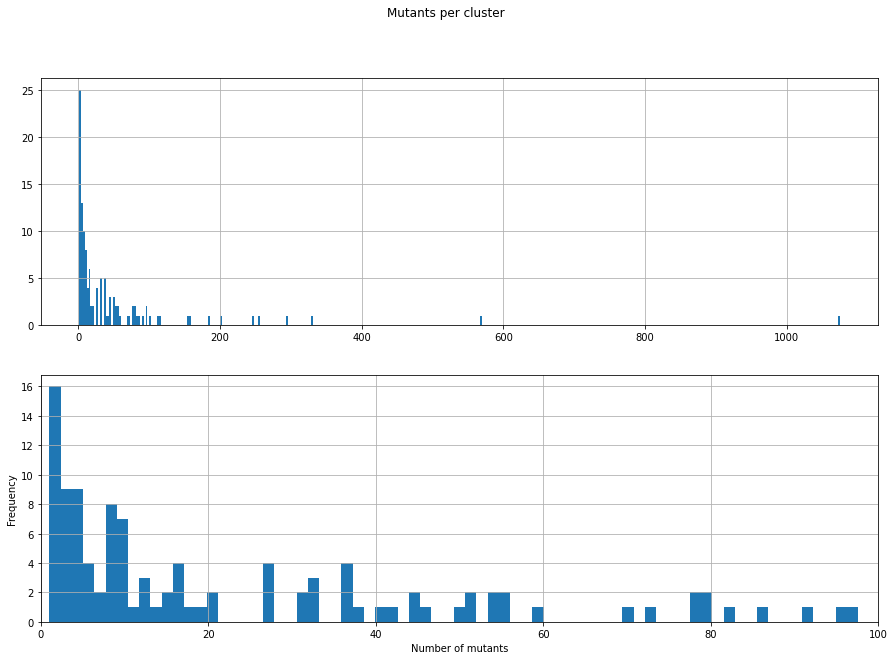

In [8]:
# compile predictions and measurements for statistical analysis
db_class = db_preds.join(db_measurements).drop('code', axis=1).join(db_clusters) #.join(db_runtimes.drop('code', axis=1))
print('Original unique mutations:', len(db_class))

# can uncomment to look at non-ProTherm or Curated mutaions
#db_class = db_class.loc[~db_class['ProTherm'].astype(bool)]
#db_class = db_class.loc[~(db_class.index.str[:4]=='1PGA')]
#db_class = db_class.loc[db_class['is_curated'].astype(bool)]

# dropna from korpm 
db_class = db_class.dropna(subset='cartesian_ddg_dir')
#print('Unique mutations after dropping NA for Rosetta:', len(db_class))

# don't drop missing predictions from sequence-based models because we want the 
# most complete comparison of the focal inverse-folding and traditional models
#db_class = db_class.dropna(subset='msa_transformer_mean_dir')
#print(len(db_class))

original_pred_cols = [c for c in db_class.columns if '_dir' in c and not 'runtime' in c and not 'pll' in c]
original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)

db_class['ddG_dir'] = db_class['ddG']
db_class['dTm_dir'] = db_class['dTm']

evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'mifst', 'esmif']
supervised = ['cartesian_ddg', 'korpm']

db_class_rescaled = db_class.copy(deep=True)
db_class_rescaled[original_pred_cols] /= db_class_rescaled[original_pred_cols].std()

db_class['structural_dir'] = db_class_rescaled[[c for c in db_class.columns if any([s in c for s in structural])]].mean(axis=1)
db_class['evolutionary_dir'] = db_class_rescaled[[c for c in db_class.columns if any([s in c for s in evolutionary])]].mean(axis=1)
db_class['supervised_dir'] = db_class_rescaled[[c for c in db_class.columns if any([s in c for s in supervised])]].mean(axis=1)
db_class['clustered_ensemble_dir'] = db_class[['supervised_dir', 'structural_dir', 'evolutionary_dir']].mean(axis=1)

db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']

db_class['mpnn_mean_dir'] = db_class[['mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir']].mean(axis=1)
db_runtimes['runtime_mpnn_mean_dir'] = db_runtimes[['runtime_mpnn_10_00_dir', 'runtime_mpnn_20_00_dir', 'runtime_mpnn_30_00_dir']].sum(axis=1)

db_class['esmif_mean_dir'] = db_class[['esmif_multimer_dir', 'esmif_monomer_dir']].mean(axis=1)
db_runtimes['runtime_esmif_mean_dir'] = db_runtimes[['runtime_esmif_multimer_dir', 'runtime_esmif_monomer_dir']].sum(axis=1)

db_class['mif_mean_dir'] = db_class[['mif_dir', 'mifst_dir']].mean(axis=1)
db_runtimes['runtime_mif_mean_dir'] = db_runtimes[['runtime_mif_dir', 'runtime_mifst_dir']].sum(axis=1)

db_class['esm2_mean_dir'] = db_class[['esm2_15B_half_dir', 'esm2_dir', 'esm2_650M_dir', 'esm2_150M_dir']].mean(axis=1)
db_runtimes['runtime_esm2_mean_dir'] = db_runtimes[['runtime_esm2_15B_half_dir', 'runtime_esm2_dir', 'runtime_esm2_650M_dir', 'runtime_esm2_150M_dir']].sum(axis=1)

#db_class['ensemble_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
# random (Gaussian noise) control
db_class['random_dir'] = np.random.normal(loc=0, size=len(db_class))

#db_class = db_class.reset_index('uid2', drop=True)

fig, axes = plt.subplots(2, figsize=(15, 10)) 
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=800, ax=axes[1])
plt.xlim([0,100])
plt.suptitle('Mutants per cluster')
plt.xlabel('Number of mutants')
plt.ylabel('Frequency')

group_counts = db_class.groupby('cluster').count().iloc[:, 0]
large_groups = group_counts > 10
filtered_df = db_class[db_class['cluster'].isin(large_groups[large_groups].index)]
db_class = filtered_df

l1 = len(db_class)
db_class = db_class.loc[~db_feats_2['on_interface']]
l2 = len(db_class)
print(f'Dropped {l1-l2} interface mutations')
#db_class = db_class.loc[~db_feats_2['on_interface']]
#print(f'Dropped {l2-len(db_class)} mutations in binding regions')

db_class

print('Unique mutations in chosen set:', len(db_class))
print('Unique clusters (protein families with significant structural homology):', len(db_class['cluster'].unique()))

In [12]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
summ = analysis_utils.compute_stats(db_class, stats=(), n_classes=2, grouper='cluster')
rcv = summ.copy(deep=True)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

In [13]:
# uncomment this to save all stats and see which are available for other analyses
#summ.to_csv('~/zs_suppl/fireprot_summ_final_2_classes_all.csv')
#tmp = summ.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = summ
tmp = tmp.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'pred_positives', 'mean_stabilization', 'mean PPC', 'mean MSC', 'True Positives', 'Sensitivity', 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta_CartDDG', 'ProteinMPNN_mean', 'ProteinMPNN_30', 'ProteinMPNN_20', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 'ESM-2_3B', 'ESM-2_15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2_150M', 'ESM-2_650M', 'Ensemble', 'ESM-2_mean', 'ESM-IF_mean', 'MIF_mean', 'Clustered_Ensemble', 'Ensemble_2',
                            'ProteinMPNN_10', 'MIF-ST', 'KORPM', 'MSA-T_mean', 'MSA-T_1', 'Tranception', 'ESM-1V_mean', 'ESM-1V_2', 'Gaussian noise', 'ΔΔG label', 'ΔTm label', 'ProteinMPNN + Rosetta_CartDDG', 'MutComputeX', 'Stability_Oracle'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
#tmp.to_csv('~/zs_suppl/fireprot_summ_final_2_classes_select.csv')
tmp

n    MCC  AUPRC      ρ  wNDCG  \
measurement model_type   model                                              
ΔΔG         unknown      ΔΔG label     4719.0  1.000  1.000  1.000  1.000   
                         ΔTm label     1428.0  0.794  0.856  0.891  0.900   
            NaN          Supervised    4719.0  0.343  0.546  0.634  0.672   
                         Structural    4719.0  0.226  0.388  0.413  0.644   
            structural   MIF           4719.0  0.217  0.445  0.449  0.636   
            potential    KORPM         4719.0  0.286  0.468  0.517  0.626   
            structural   MIF-ST        4719.0  0.191  0.436  0.425  0.604   
                         ESM-IF        4719.0  0.216  0.440  0.376  0.608   
                         ESM-IF(M)     4719.0  0.204  0.436  0.373  0.601   
            NaN          Evolutionary  4719.0  0.160  0.383  0.267  0.576   
            structural   MutComputeX   4676.0  0.192  0.444  0.382  0.611   
            evolutionary Ankh          4719.0  0.133  0.374  0.295  0.573   
                         Tranception   4719.0  0.101  0.349  0.253  0.537   
ΔTm         unknown      ΔTm label     2451.0  1.000  1.000  1.000  1.000   
                         ΔΔG label     1428.0  0.794  0.908  0.891  0.927   
            NaN          Supervised    2451.0  0.295  0.508  0.546  0.681   
                         Structural    2451.0  0.295  0.509  0.503  0.708   
            structural   ESM-IF        2451.0  0.248  0.547  0.552  0.681   
                         MIF           2451.0  0.274  0.536  0.479  0.685   
                         ESM-IF(M)     2451.0  0.259  0.544  0.548  0.675   
                         MIF-ST        2451.0  0.205  0.500  0.430  0.648   
            potential    KORPM         2451.0  0.258  0.470  0.445  0.649   
            NaN          Evolutionary  2451.0  0.200  0.486  0.394  0.629   
            structural   MutComputeX   2416.0  0.224  0.513  0.386  0.652   
            evolutionary Ankh          2451.0  0.190  0.471  0.410  0.622   
                         Tranception   2451.0  0.143  0.443  0.389  0.590   

                                       wAUPRC     wρ  mean_t1s  \
measurement model_type   model                                   
ΔΔG         unknown      ΔΔG label      0.971  1.000     2.205   
                         ΔTm label      0.826  0.848     1.078   
            NaN          Supervised     0.561  0.510     0.403   
                         Structural     0.527  0.449     0.386   
            structural   MIF            0.496  0.422     0.395   
            potential    KORPM          0.492  0.415     0.214   
            structural   MIF-ST         0.460  0.388     0.173   
                         ESM-IF         0.500  0.386     0.212   
                         ESM-IF(M)      0.481  0.379     0.006   
            NaN          Evolutionary   0.437  0.318     0.138   
            structural   MutComputeX    0.475  0.310     0.148   
            evolutionary Ankh           0.447  0.273    -0.122   
                         Tranception    0.394  0.255    -0.151   
ΔTm         unknown      ΔTm label      0.979  1.000     7.126   
                         ΔΔG label      0.848  0.848     5.138   
            NaN          Supervised     0.585  0.420     1.234   
                         Structural     0.617  0.414     3.557   
            structural   ESM-IF         0.579  0.392     2.495   
                         MIF            0.582  0.392     1.825   
                         ESM-IF(M)      0.575  0.391     2.101   
                         MIF-ST         0.583  0.335     1.397   
            potential    KORPM          0.544  0.316     0.296   
            NaN          Evolutionary   0.587  0.265     0.990   
            structural   MutComputeX    0.563  0.263     1.704   
            evolutionary Ankh           0.577  0.248     1.046   
                         Tranception    0.536  0.176    -0.056   

                                      

In [14]:
importlib.reload(analysis_utils)
db_class['code'] = db_class.index.str[:4]

summ = analysis_utils.compute_stats(db_class.drop('code', axis=1), 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'recall@k0.0', 'recall@k1.0'), 
                                    measurements=['ddG', 'dTm'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)

In [15]:
tmp1 = summ.xs('ddG').reset_index()
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp1.sort_values('net_stabilization_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir'])]#.drop('measurement', axis=1)
s4 = s3[['model_type', 'model', 
    'n_mean', 'n_std',
    'recall@k1.0_mean', 'recall@k1.0_std',
    'ndcg_mean', 'ndcg_std',
    'weighted_ndcg_mean', 'weighted_ndcg_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'auprc_mean', 'auprc_std', 
    'MCC_mean', 'MCC_std', 
    'mean_stabilization_mean', 'mean_stabilization_std', 
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
s6

,Model Type,Model,n,Recall @ k,NDCG,wNDCG,Spearman's ρ,wρ,AUPRC,MCC,Mean Stabilization,Net Stabilization
0,unknown,ΔΔG label,4776.77 ± 1192.63,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.754 ± 0.13,1782.386 ± 764.12
1,biophysical,Rosetta CartDDG,4776.77 ± 1192.63,0.283 ± 0.03,0.725 ± 0.05,0.68 ± 0.02,0.606 ± 0.05,0.495 ± 0.03,0.536 ± 0.05,0.342 ± 0.02,0.086 ± 0.14,165.72 ± 337.69
2,structural,ProteinMPNN 0.1,4776.77 ± 1192.63,0.232 ± 0.03,0.712 ± 0.05,0.687 ± 0.02,0.45 ± 0.06,0.434 ± 0.02,0.473 ± 0.03,0.255 ± 0.05,0.087 ± 0.18,103.112 ± 223.7
3,structural,MIF-ST,4776.77 ± 1192.63,0.172 ± 0.03,0.699 ± 0.05,0.627 ± 0.02,0.426 ± 0.05,0.389 ± 0.03,0.439 ± 0.04,0.199 ± 0.03,0.117 ± 0.13,87.06 ± 105.35
4,transfer,Stability Oracle,4723.68 ± 1197.94,0.257 ± 0.04,0.705 ± 0.06,0.682 ± 0.02,0.608 ± 0.05,0.492 ± 0.03,0.521 ± 0.05,0.348 ± 0.02,0.024 ± 0.11,63.36 ± 277.46
5,structural,ProteinMPNN 0.2,4776.77 ± 1192.63,0.231 ± 0.03,0.708 ± 0.05,0.688 ± 0.02,0.459 ± 0.06,0.441 ± 0.03,0.484 ± 0.03,0.28 ± 0.04,0.041 ± 0.19,61.872 ± 261.59
6,evolutionary,Tranception,4776.77 ± 1192.63,0.161 ± 0.04,0.648 ± 0.05,0.563 ± 0.02,0.25 ± 0.07,0.255 ± 0.03,0.35 ± 0.03,0.108 ± 0.04,0.186 ± 0.19,45.543 ± 52.8
7,evolutionary,ESM-2 15B,4775.78 ± 1192.7,0.151 ± 0.03,0.665 ± 0.05,0.591 ± 0.02,0.291 ± 0.05,0.295 ± 0.03,0.387 ± 0.04,0.155 ± 0.04,0.082 ± 0.21,38.199 ± 118.81
8,structural,ProteinMPNN 0.3,4776.77 ± 1192.63,0.252 ± 0.03,0.712 ± 0.05,0.697 ± 0.02,0.457 ± 0.06,0.44 ± 0.02,0.477 ± 0.03,0.267 ± 0.05,0.008 ± 0.18,11.659 ± 259.79
9,structural,ESM-IF,4776.77 ± 1192.63,0.185 ± 0.04,0.7 ± 0.05,0.632 ± 0.02,0.403 ± 0.07,0.385 ± 0.03,0.447 ± 0.03,0.225 ± 0.04,-0.0 ± 0.2,10.338 ± 198.12


In [16]:
tmp1 = summ.xs('dTm').reset_index()
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp1.sort_values('net_stabilization_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'dTm_dir'])]#.drop('measurement', axis=1)
s4 = s3[['model_type', 'model', 
    'recall@k1.0_mean', 'recall@k1.0_std',
    'ndcg_mean', 'ndcg_std',
    'weighted_ndcg_mean', 'weighted_ndcg_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'auprc_mean', 'auprc_std', 
    'MCC_mean', 'MCC_std', 
    'mean_stabilization_mean', 'mean_stabilization_std', 
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
s6

,Model Type,Model,Recall @ k,NDCG,wNDCG,Spearman's ρ,wρ,AUPRC,MCC,Mean Stabilization,Net Stabilization
0,unknown,ΔTm label,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,2.755 ± 0.41,4313.625 ± 1192.17
1,structural,ProteinMPNN 0.2,0.44 ± 0.04,0.782 ± 0.03,0.709 ± 0.02,0.519 ± 0.06,0.38 ± 0.03,0.575 ± 0.04,0.306 ± 0.04,1.415 ± 0.57,1331.19 ± 645.56
2,structural,ProteinMPNN 0.3,0.436 ± 0.04,0.794 ± 0.03,0.709 ± 0.02,0.508 ± 0.07,0.367 ± 0.03,0.573 ± 0.04,0.314 ± 0.04,1.195 ± 0.58,1259.137 ± 746.53
3,structural,ProteinMPNN 0.1,0.438 ± 0.04,0.785 ± 0.03,0.704 ± 0.02,0.502 ± 0.07,0.399 ± 0.03,0.567 ± 0.04,0.297 ± 0.04,1.274 ± 0.67,1143.431 ± 692.89
4,structural,ESM-IF,0.398 ± 0.04,0.806 ± 0.03,0.702 ± 0.02,0.531 ± 0.08,0.38 ± 0.03,0.551 ± 0.03,0.248 ± 0.03,1.679 ± 0.66,1106.61 ± 589.22
5,structural,ESM-IF(M),0.392 ± 0.04,0.807 ± 0.03,0.693 ± 0.02,0.527 ± 0.08,0.38 ± 0.03,0.548 ± 0.04,0.258 ± 0.03,1.703 ± 0.69,1077.125 ± 578.84
6,biophysical,Rosetta CartDDG,0.398 ± 0.04,0.745 ± 0.04,0.707 ± 0.02,0.527 ± 0.09,0.429 ± 0.04,0.513 ± 0.05,0.296 ± 0.05,0.679 ± 0.5,965.778 ± 787.56
7,structural,MIF,0.412 ± 0.03,0.766 ± 0.03,0.708 ± 0.02,0.465 ± 0.08,0.391 ± 0.03,0.54 ± 0.04,0.274 ± 0.03,0.854 ± 0.59,799.858 ± 640.63
8,evolutionary,ESM-2 650M,0.376 ± 0.04,0.74 ± 0.04,0.672 ± 0.02,0.355 ± 0.08,0.263 ± 0.05,0.493 ± 0.04,0.224 ± 0.04,0.826 ± 0.63,650.038 ± 551.66
9,structural,MIF-ST,0.372 ± 0.03,0.754 ± 0.04,0.674 ± 0.02,0.418 ± 0.08,0.331 ± 0.03,0.505 ± 0.04,0.204 ± 0.04,0.901 ± 0.73,613.312 ± 570.42


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

cartesian_ddg_dir
esm2_650M_dir
korpm_dir
mpnn_20_00_dir
mpnn_rosetta_dir
stability-oracle_dir
ddG_dir
random_dir


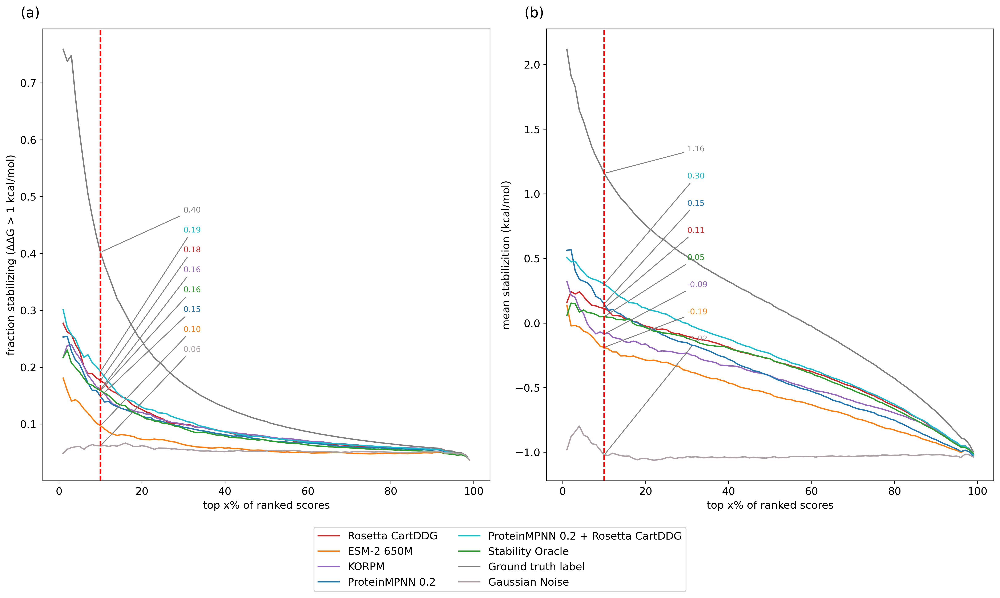

In [17]:
class_result_new = analysis_utils.compute_stats(db_class.drop('code', axis=1), stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
analysis_utils.recovery_curves(class_result_new, ['mpnn_20_00_dir', 'cartesian_ddg_dir', 'stability-oracle_dir', 'mpnn_rosetta_dir', 'korpm_dir', 'esm2_650M_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc']) #'mif_dir', 'esmif_multimer_full_dir',

In [18]:
# SUPPLEMENTARY TABLE 2
db_class_np = db_class.loc[~db_class['ProTherm'].astype(bool)]

summ2 = analysis_utils.compute_stats(db_class_np.drop('code', axis=1), stats=(), n_classes=2, grouper='cluster')
#summ2.to_csv('~/zs_suppl/fireprot_summ2_final_2_classes_no_protherm_all.csv')
tmp2 = summ2#.loc[:,['MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp2 = tmp2.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp2['model'] = tmp2['model'].map(remap_names_2)
tmp2['measurement'] = tmp2['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp2.loc[tmp2['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC'}
tmp2 = tmp2.rename(remap_cols, axis=1)
tmp2 = tmp2[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'net_stabilization', 'pred_positives', 'mean_stabilization', 'mean PPC', 'mean MSC']]
tmp2 = tmp2.loc[tmp2['model'].isin(['Rosetta_CartDDG', 'ProteinMPNN_mean', 'ProteinMPNN_30', 'ProteinMPNN_20', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 'ESM2_3B', 'ESM2_15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM2_150M', 'ESM2_650M', 'Ensemble', 'ESM-2_mean', 'ESM-IF_mean', 'MIF_mean', 'Clustered_Ensemble', 'Ensemble_2',
                            'ProteinMPNN_10', 'MIF-ST', 'KORPM', 'MSA-T_mean', 'MSA-T_1', 'Tranception', 'ESM-1V_mean', 'ESM-1V_2', 'Gaussian noise', 'ΔΔG label', 'ΔTm label'])]
tmp2 = tmp2.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
#tmp2.to_csv('~/zs_suppl/fireprot_summ_final_2_classes_no_protherm_select.csv')
tmp2

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

n    MCC  AUPRC      ρ  wNDCG  \
measurement model_type   model                                              
ΔΔG         unknown      ΔΔG label     1626.0  1.000  1.000  1.000  1.000   
                         ΔTm label       25.0  0.840  0.927  0.772  0.677   
            NaN          Structural    1626.0  0.206  0.482  0.371  0.706   
                         Supervised    1626.0  0.359  0.679  0.665  0.800   
            potential    KORPM         1626.0  0.325  0.599  0.532  0.740   
            structural   ESM-IF        1626.0  0.166  0.506  0.343  0.695   
                         MIF           1626.0  0.146  0.525  0.392  0.703   
                         ESM-IF(M)     1626.0  0.156  0.502  0.347  0.685   
                         MIF-ST        1626.0  0.172  0.564  0.406  0.685   
            NaN          Evolutionary  1626.0  0.111  0.459  0.222  0.670   
            evolutionary Tranception   1626.0  0.070  0.401  0.131  0.654   
                         Ankh          1626.0  0.139  0.476  0.254  0.658   
ΔTm         unknown      ΔTm label      851.0  1.000  1.000  1.000  1.000   
                         ΔΔG label       25.0  0.840  0.856  0.772  0.868   
            structural   ESM-IF(M)      851.0  0.182  0.517  0.352  0.664   
                         MIF            851.0  0.177  0.540  0.333  0.676   
            NaN          Structural     851.0  0.189  0.554  0.375  0.691   
            structural   ESM-IF         851.0  0.149  0.514  0.356  0.664   
            NaN          Evolutionary   851.0  0.128  0.494  0.268  0.611   
            structural   MIF-ST         851.0  0.092  0.508  0.277  0.609   
            evolutionary Ankh           851.0  0.136  0.493  0.271  0.604   
            NaN          Supervised     851.0  0.098  0.452  0.247  0.620   
            evolutionary Tranception    851.0  0.099  0.471  0.259  0.619   
            potential    KORPM          851.0  0.121  0.445  0.217  0.611   

                                       wAUPRC     wρ  mean_t1s  \
measurement model_type   model                                   
ΔΔG         unknown      ΔΔG label      0.825  1.000     0.979   
                         ΔTm label      0.726  0.512     0.036   
            NaN          Structural     0.545  0.415    -0.031   
                         Supervised     0.624  0.405     0.004   
            potential    KORPM          0.550  0.368    -0.083   
            structural   ESM-IF         0.522  0.364     0.035   
                         MIF            0.503  0.360    -0.020   
                         ESM-IF(M)      0.519  0.358    -0.094   
                         MIF-ST         0.522  0.319    -0.136   
            NaN          Evolutionary   0.473  0.269    -0.126   
            evolutionary Tranception    0.449  0.186    -0.219   
                         Ankh           0.460  0.146    -0.193   
ΔTm         unknown      ΔTm label      0.941  1.000     5.213   
                         ΔΔG label      0.586  0.512     1.099   
            structural   ESM-IF(M)      0.568  0.218     0.345   
                         MIF            0.572  0.205     1.038   
            NaN          Structural     0.589  0.194     1.663   
            structural   ESM-IF         0.569  0.193     0.913   
            NaN          Evolutionary   0.580  0.159     0.322   
            structural   MIF-ST         0.548  0.129    -0.551   
            evolutionary Ankh           0.589  0.118    -0.620   
            NaN          Supervised     0.539  0.081     0.565   
            evolutionary Tranception    0.586  0.079     0.849   
            potential    KORPM          0.523  0.072     0.671   

                                       net_stabilization  pred_positives  \
measurement model_type   model                                             
ΔΔG         unknown      ΔΔG label               367.760           602.0   
                         ΔTm label                 6.805            13.0   
            NaN     

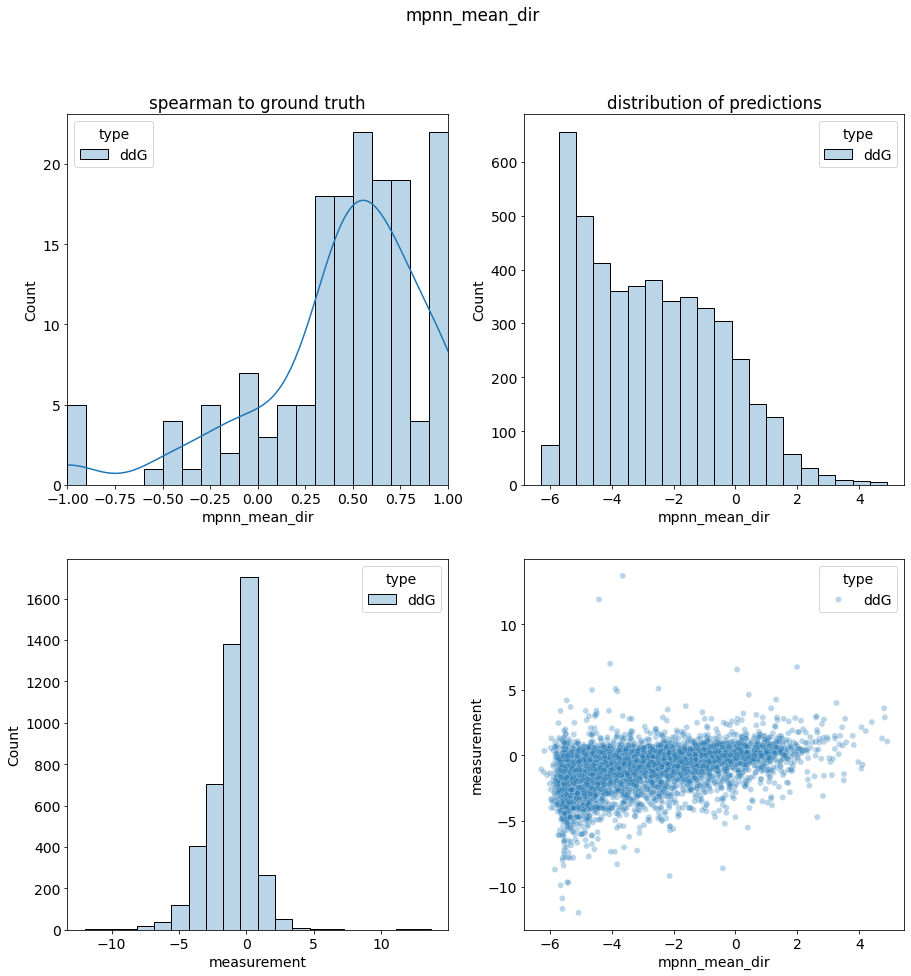

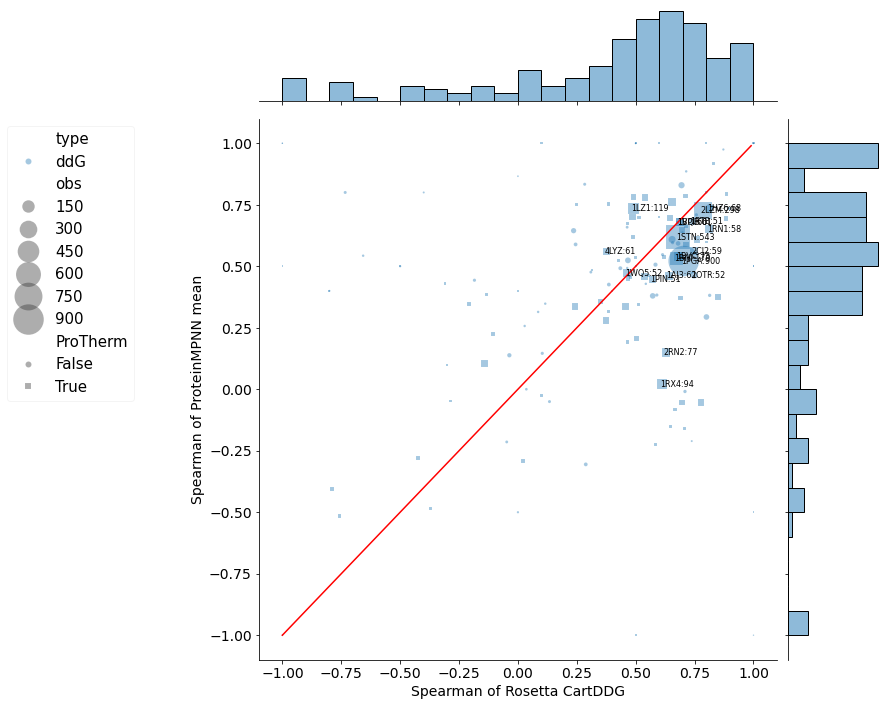

mpnn_mean_dir cartesian_ddg_dir
ddG n_total                      4719              4719
    ungrouped_spearman       0.463273           0.61886
    n_proteins                    132               132
    n_proteins_spearman           160               160
    avg_spearman             0.448078          0.402923
    weighted_spearman        0.451592          0.455314
    runtime (s)            111.661136         1935286.0

In [19]:
# SUPPLEMENTARY FIGURE 1 (second figure generated)

#db_corr = db_class.join(db_measurements)

db_class_ = db_class.copy(deep=True)
db_class_['code'] = db_class_.index.str[:4]
analysis_utils.correlations(db_class_, db_runtimes, stat='spearman', 
    score_name='mpnn_mean_dir', score_name_2='cartesian_ddg_dir', min_obs=1, group=True, plot=True, out=True, runtime=True)

In [20]:
# SUPPLEMENTARY TABLE 3

tmp3_ = analysis_utils.compute_stats(db_class.drop('code', axis=1), stats=['tp', 'fp', 'tn', 'fn', 'mean_t1s', 'auppc', 'aumsc', 'mean_stabilization', 'net_stabilization'], grouper='cluster')
#tmp_.to_csv('~/zs_suppl/fireprot_enrichment_all.csv')
tmp3 = tmp3_.sort_values(['measurement', 'net_stabilization'], ascending=False).reset_index()

tmp3['model'] = tmp3['model'].map(remap_names_2)
tmp3['measurement'] = tmp3['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp3.loc[tmp3['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'tp': 'TP', 'fp': 'FP', 'tn': 'TN', 'fn': 'FN', 'mean_t1s': 'Mean Top-1 Score', 'auppc': 'AUPPC', 'aumsc': 'AUMSC', 'mean_stabilization': 'Mean Stabilization', 'net_stabilization': 'Net Stabilization'}
tmp3 = tmp3.rename(remap_cols, axis=1)
tmp3 = tmp3.drop('runtime', axis=1)
tmp3 = tmp3.drop('class', axis=1)
tmp3 = tmp3.drop([c for c in tmp3.columns if '$' in c or 'x_recovery' in c], axis=1)
tmp3 = tmp3.loc[tmp3['model'].isin(['Rosetta_CartDDG', 'ProteinMPNN_mean', 'ProteinMPNN_30', 'ProteinMPNN_20', 'ESM-IF', 'MIF', 'ESM-IF(M)',
                            'ProteinMPNN_10', 'MIF-ST', 'KORPM', 'MSA-T_mean', 'MSA-T_1', 'Tranception', 'ESM-1V_mean', 'ESM-1V_2', 'Gaussian noise', 'ΔΔG label', 'ΔTm label'])]
tmp3 = tmp3.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp3 = tmp3[['TP', 'FP', 'TN', 'FN', 'AUPPC', 'AUMSC', 'Mean Top-1 Score', 'Mean Stabilization', 'Net Stabilization']]
#tmp3.to_csv('~/zs_suppl/fireprot_enrichment_select.csv')
tmp3
# ~ 3 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

TP     FP      TN      FN  AUPPC  \
measurement model_type   model                                               
ΔΔG         unknown      ΔΔG label    1278.0    0.0  3441.0     0.0  0.172   
                         ΔTm label     336.0   68.0   974.0    50.0  0.180   
            structural   MIF-ST        211.0  167.0  3274.0  1067.0  0.073   
            evolutionary Tranception    68.0   57.0  3384.0  1210.0  0.056   
            structural   ESM-IF        261.0  204.0  3237.0  1017.0  0.076   
                         MIF           324.0  303.0  3138.0   954.0  0.085   
                         ESM-IF(M)     251.0  208.0  3233.0  1027.0  0.074   
            potential    KORPM         594.0  630.0  2811.0   684.0  0.093   
ΔTm         unknown      ΔTm label     785.0    0.0  1666.0     0.0  0.452   
                         ΔΔG label     336.0   50.0   974.0    68.0  0.412   
            structural   ESM-IF        202.0  127.0  1539.0   583.0  0.282   
                         ESM-IF(M)     201.0  116.0  1550.0   584.0  0.281   
                         MIF           275.0  198.0  1468.0   510.0  0.285   
                         MIF-ST        195.0  157.0  1509.0   590.0  0.274   
            evolutionary Tranception   140.0  136.0  1530.0   645.0  0.236   
            potential    KORPM         393.0  402.0  1264.0   392.0  0.286   

                                      AUMSC  Mean Top-1 Score  \
measurement model_type   model                                  
ΔΔG         unknown      ΔΔG label    0.200             2.205   
                         ΔTm label    0.099             1.078   
            structural   MIF-ST      -0.440             0.173   
            evolutionary Tranception -0.637            -0.151   
            structural   ESM-IF      -0.425             0.212   
                         MIF         -0.410             0.395   
                         ESM-IF(M)   -0.430             0.006   
            potential    KORPM       -0.428             0.214   
ΔTm         unknown      ΔTm label    1.104             7.126   
                         ΔΔG label    0.498             5.138   
            structural   ESM-IF      -0.846             2.495   
                         ESM-IF(M)   -0.861             2.101   
                         MIF         -1.032             1.825   
                         MIF-ST      -1.122             1.397   
            evolutionary Tranception -1.713            -0.056   
            potential    KORPM       -1.240             0.296   

                                      Mean Stabilization  Net Stabilization  
measurement model_type   model                                               
ΔΔG         unknown      ΔΔG label                 0.723            923.525  
                         ΔTm label                 0.598            241.570  
            structural   MIF-ST                    0.114             43.130  
            evolutionary Tranception               0.202             25.215  
            structural   ESM-IF                    0.038             17.700  
                         MIF                       0.007              4.280  
                         ESM-IF(M)                -0.012             -5.545  
            potential    KORPM                    -0.128           -156.655  
ΔTm         unknown      ΔTm label                 2.736           2147.945  
                         ΔΔG label                 2.692           1039.300  
            structural   ESM-IF                    1.686            554.670  
                         ESM-IF(M)                 1.703            539.710  
                         MIF                       0.812            383.975  
                         MIF-ST                    0.869            305.935  
            evolutionary Tranception               0.140             38.755  
            potential    KORPM                    -0.119            -94.420

  0%|          | 0/1000 [00:00<?, ?it/s]

Text(0, 0, 'ddG_dir')
Text(1, 0, 'cartesian_ddg_dir')
Text(2, 0, 'stability-oracle_dir')
Text(3, 0, 'mpnn_20_00_dir')
Text(4, 0, 'korpm_dir')
Text(5, 0, 'mif_dir')
Text(6, 0, 'mifst_dir')
Text(7, 0, 'esmif_mean_dir')
Text(8, 0, 'esm2_650M_dir')
Text(9, 0, 'mutcomputex_dir')
Text(10, 0, 'esm2_15B_half_dir')
Text(11, 0, 'ankh_dir')
Text(12, 0, 'msa_transformer_mean_dir')
Text(13, 0, 'tranception_dir')
Text(14, 0, 'random_dir')
['ddG_dir', 'cartesian_ddg_dir', 'stability-oracle_dir', 'mpnn_20_00_dir', 'korpm_dir', 'mif_dir', 'mifst_dir', 'esmif_mean_dir', 'esm2_650M_dir', 'mutcomputex_dir', 'esm2_15B_half_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'random_dir']
class
0 >= ΔΔG > -1.5    1562
ΔΔG <= -1.5         964
ΔΔG > 0             807
Name: n, dtype: int64


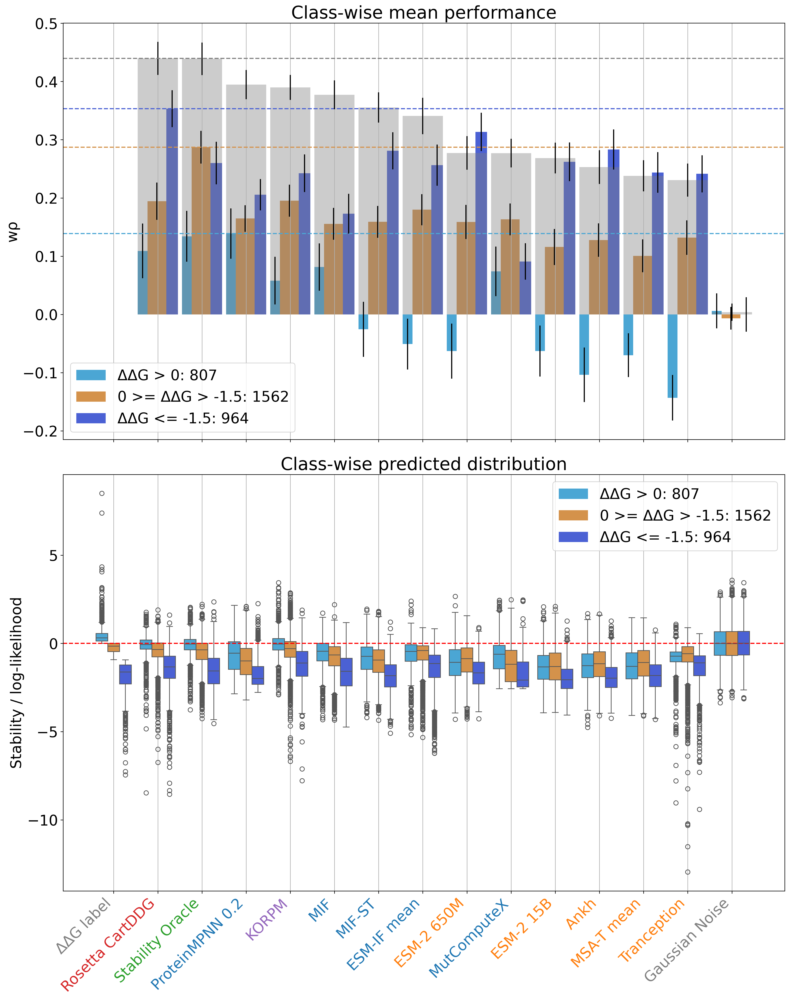

In [21]:
# Todo: bootstrap by adding / removing proteins?
# Figure 1 a + b
importlib.reload(analysis_utils)

custom_colors = {'cartesian_ddg_dir': 'orange',
                 'korpm_dir': 'orange',
                 #'esm1v_mean_dir': 'blue',
                 #'structural_dir': 'red',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_dir': 'green',
                 #'evolutionary_dir': 'green',
                 'esm2_650M_dir': 'blue',
                 'esm2_15B_half_dir': 'blue',
                 #'esm2_150M_dir': 'blue',
                 'ankh_dir': 'blue',
                 #'esmif_monomer_dir': 'red',
                 'esmif_mean_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 #'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_mean_dir': 'red',
                 #'mif_mean_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'red',
                 'mutcomputex_dir': 'red',
                 'stability-oracle_dir': 'orange',
                 #'mifst_dir': 'purple',
                 'random_dir': 'grey',
                 'ddG_dir': 'grey'}

db_complete = db_class.join(db_feats_2.drop(['ProTherm', 'FireProt', 'ThermoFluor', 'is_curated'], axis=1), how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']].fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True,
                        subset = list(custom_colors.keys()),
                        grouper = 'cluster'
                        )

  0%|          | 0/1000 [00:00<?, ?it/s]

Text(0, 0, 'ddG_dir')
Text(1, 0, 'cartesian_ddg_dir')
Text(2, 0, 'stability-oracle_dir')
Text(3, 0, 'mpnn_20_00_dir')
Text(4, 0, 'korpm_dir')
Text(5, 0, 'mif_dir')
Text(6, 0, 'mifst_dir')
Text(7, 0, 'esmif_mean_dir')
Text(8, 0, 'esm2_650M_dir')
Text(9, 0, 'mutcomputex_dir')
Text(10, 0, 'esm2_15B_half_dir')
Text(11, 0, 'ankh_dir')
Text(12, 0, 'msa_transformer_mean_dir')
Text(13, 0, 'tranception_dir')
Text(14, 0, 'random_dir')
['ddG_dir', 'cartesian_ddg_dir', 'stability-oracle_dir', 'mpnn_20_00_dir', 'korpm_dir', 'mif_dir', 'mifst_dir', 'esmif_mean_dir', 'esm2_650M_dir', 'mutcomputex_dir', 'esm2_15B_half_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'random_dir']
class
1 >= delta_vol > -1     942
delta_vol <= -1        1610
delta_vol > 1           774
Name: n, dtype: int64


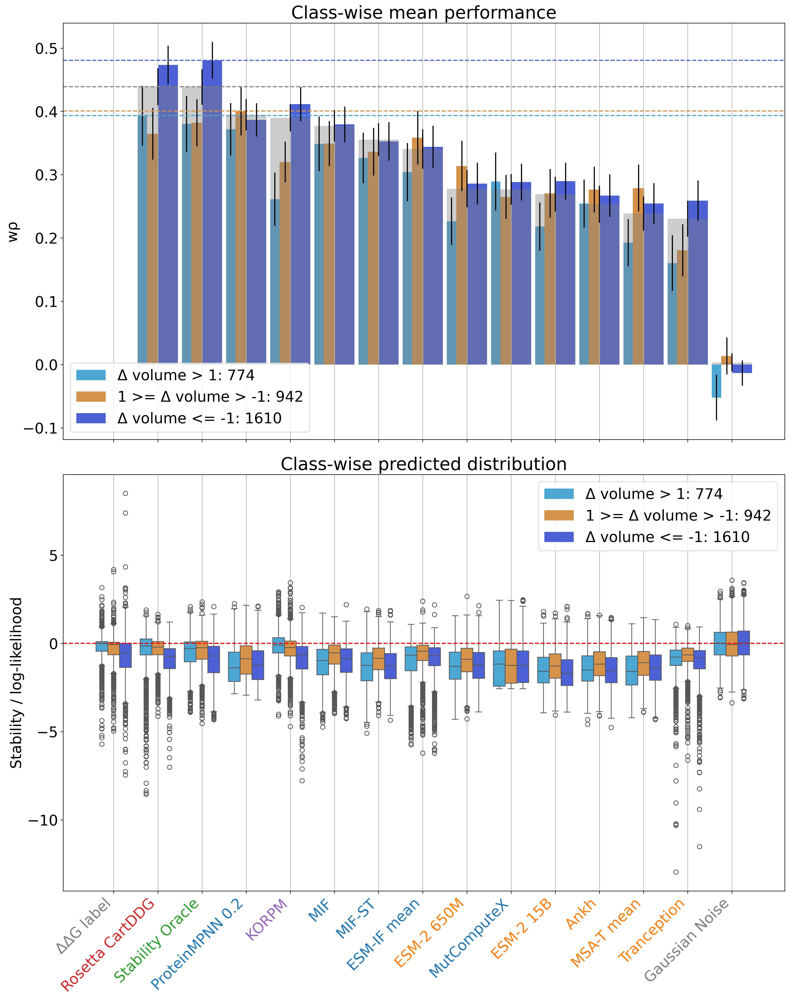

In [22]:
# Figure 1 c + d

current_feats = ['delta_vol', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']].fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_vol', 
                        split_col_2 = None, 
                        threshold_1 = 1, 
                        threshold_2 = -1, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True,
                        subset = list(custom_colors.keys()),
                        grouper = 'cluster'
                        )

  0%|          | 0/1000 [00:00<?, ?it/s]

Text(0, 0, 'ddG_dir')
Text(1, 0, 'cartesian_ddg_dir')
Text(2, 0, 'stability-oracle_dir')
Text(3, 0, 'mpnn_20_00_dir')
Text(4, 0, 'korpm_dir')
Text(5, 0, 'mif_dir')
Text(6, 0, 'mifst_dir')
Text(7, 0, 'esmif_mean_dir')
Text(8, 0, 'mutcomputex_dir')
Text(9, 0, 'esm2_650M_dir')
Text(10, 0, 'esm2_15B_half_dir')
Text(11, 0, 'ankh_dir')
Text(12, 0, 'msa_transformer_mean_dir')
Text(13, 0, 'tranception_dir')
Text(14, 0, 'random_dir')
['ddG_dir', 'cartesian_ddg_dir', 'stability-oracle_dir', 'mpnn_20_00_dir', 'korpm_dir', 'mif_dir', 'mifst_dir', 'esmif_mean_dir', 'mutcomputex_dir', 'esm2_650M_dir', 'esm2_15B_half_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'random_dir']
class
delta_kdh <= 0 & rel_ASA <= 0.1     674
delta_kdh <= 0 & rel_ASA > 0.1      908
delta_kdh > 0 & rel_ASA <= 0.1      462
delta_kdh > 0 & rel_ASA > 0.1      1275
Name: n, dtype: int64


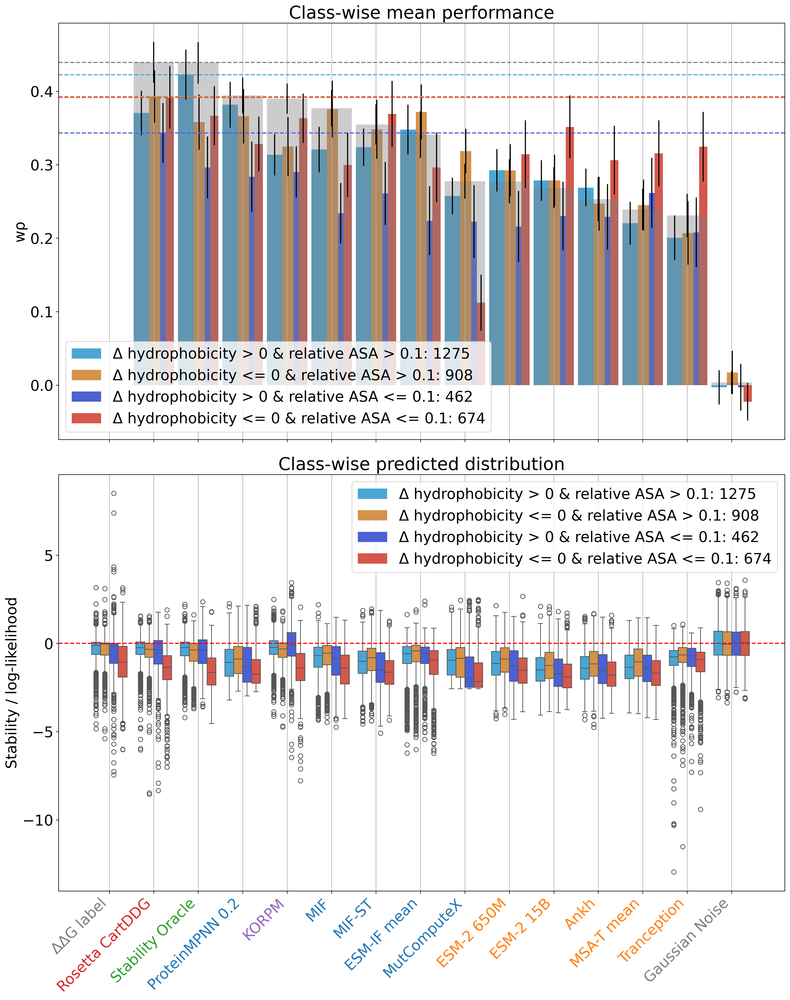

In [23]:
# Supplementary Figure 2

current_feats = ['delta_kdh', 'rel_ASA', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']].fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'rel_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 0.1, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True,
                        subset = list(custom_colors.keys()),
                        grouper = 'cluster')

  0%|          | 0/1000 [00:00<?, ?it/s]

conservation > 80% : 563
conservation <= 80% : 2867
Text(0, 0, 'ddG_dir')
Text(1, 0, 'cartesian_ddg_dir')
Text(2, 0, 'stability-oracle_dir')
Text(3, 0, 'mpnn_20_00_dir')
Text(4, 0, 'korpm_dir')
Text(5, 0, 'mif_dir')
Text(6, 0, 'mifst_dir')
Text(7, 0, 'esmif_mean_dir')
Text(8, 0, 'esm2_650M_dir')
Text(9, 0, 'mutcomputex_dir')
Text(10, 0, 'esm2_15B_half_dir')
Text(11, 0, 'ankh_dir')
Text(12, 0, 'msa_transformer_mean_dir')
Text(13, 0, 'tranception_dir')
Text(14, 0, 'random_dir')
['ddG_dir', 'cartesian_ddg_dir', 'stability-oracle_dir', 'mpnn_20_00_dir', 'korpm_dir', 'mif_dir', 'mifst_dir', 'esmif_mean_dir', 'esm2_650M_dir', 'mutcomputex_dir', 'esm2_15B_half_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'random_dir']
class
conservation <= 80    2867
conservation > 80      563
Name: n, dtype: int64


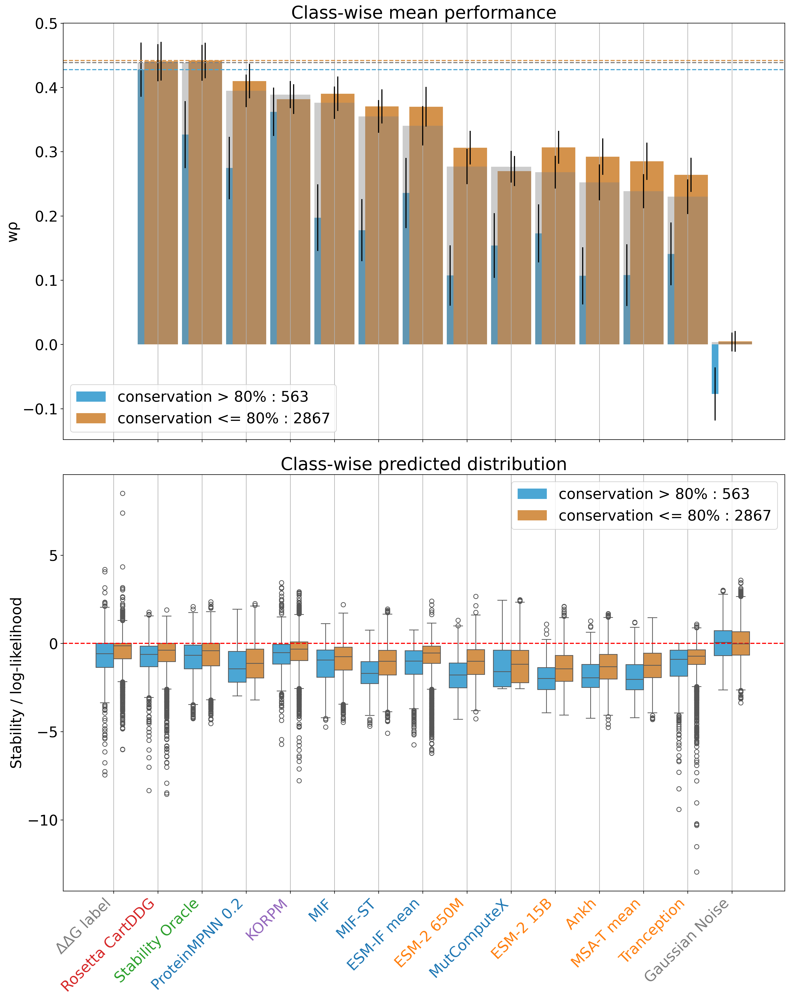

In [24]:
# Supplementary Figure 3

current_feats = ['conservation', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']].fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'conservation', 
                        split_col_2 = None, 
                        threshold_1 = 80, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True,
                        subset = list(custom_colors.keys()),
                        grouper = 'cluster')

  0%|          | 0/1000 [00:00<?, ?it/s]

Text(0, 0, 'ddG_dir')
Text(1, 0, 'cartesian_ddg_dir')
Text(2, 0, 'mpnn_mean_dir')
Text(3, 0, 'korpm_dir')
Text(4, 0, 'mif_dir')
Text(5, 0, 'mifst_dir')
Text(6, 0, 'esmif_multimer_dir')
Text(7, 0, 'esm1v_mean_dir')
Text(8, 0, 'msa_transformer_mean_dir')
Text(9, 0, 'tranception_dir')
['ddG_dir', 'cartesian_ddg_dir', 'mpnn_mean_dir', 'korpm_dir', 'mif_dir', 'mifst_dir', 'esmif_multimer_dir', 'esm1v_mean_dir', 'msa_transformer_mean_dir', 'tranception_dir']
class
is_nmr <= 0.5    3106
is_nmr > 0.5      291
Name: n, dtype: int64


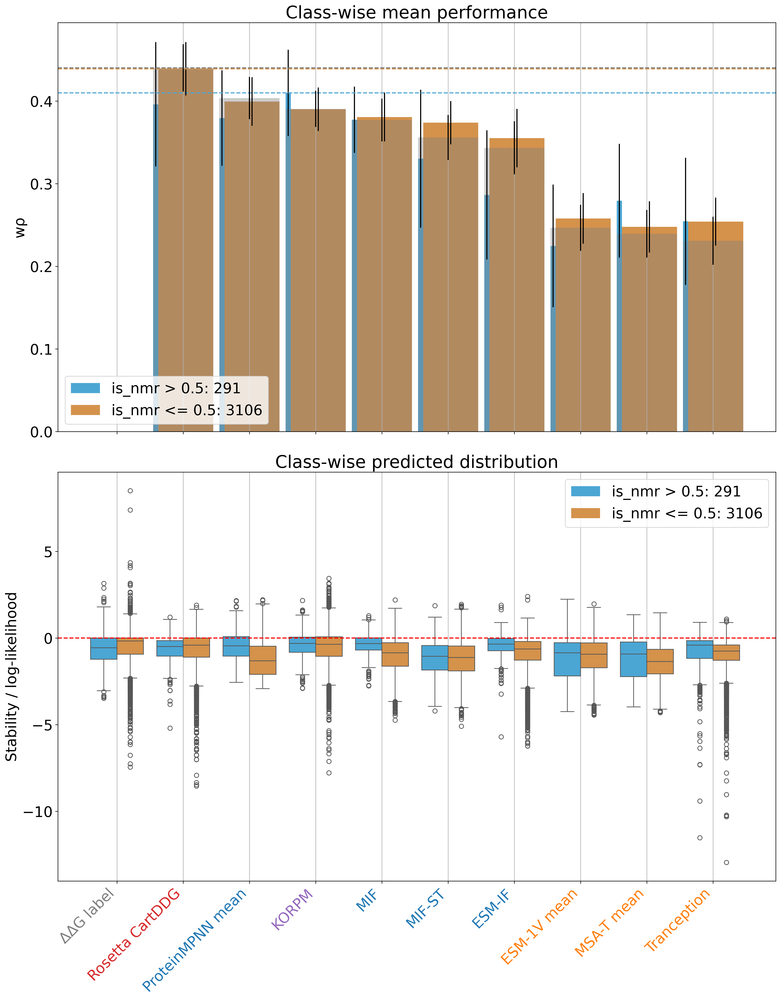

In [25]:
custom_colors = {'cartesian_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}
                 
current_feats = ['is_nmr', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']].fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'is_nmr', 
                        split_col_2 = None, 
                        threshold_1 = 0.5, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True,
                        subset = list(custom_colors.keys()),
                        grouper = 'cluster')

In [26]:
# generate ensembles for Model Complementarity section

models = original_pred_cols_reduced + \
          ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir'] + \
            ['mpnn_mean_dir', 'esmif_mean_dir', 'esm2_mean_dir', 'mif_mean_dir']
#models = ['mpnn_20_00_dir', 'cartesian_ddg_dir', 'esm2_dir']

zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']

db_summ = db_class.join(db_feats_2[zs_feats])#.join(db_clusters).join(db_ddg)#.drop('code', axis=1)
print(len(db_summ))
#db_summ = db_summ.loc[~db_summ['ProTherm'].astype(bool)]
#db_summ = db_summ.loc[db_summ['is_curated'].astype(bool)]
db_summ = db_summ.dropna(subset='cartesian_ddg_dir')
print(len(db_summ))
db_summ['ddG_dir'] = db_summ['ddG']
db_summ['dTm_dir'] = db_summ['dTm']
#db_summ['delta_vol_dir'] = db_summ['delta_vol'].transform(lambda x: -np.abs(x))
#db_summ['delta_kdh_dir'] = db_summ['delta_kdh'].transform(lambda x: -np.abs(x))
#db_summ['delta_chg_dir'] = db_summ['delta_chg'].transform(lambda x: -np.abs(x))
#db_summ['rel_ASA_dir'] = db_summ['rel_ASA']
db_summ['random_dir'] = np.random.normal(loc=0, size=len(db_summ))

dfm = db_summ#.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
dfm['code'] = dfm.index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
#dfm = dfm.drop(['is_curated'], axis=1)
dfr = db_runtimes.copy(deep=True)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
#print('saving...')
#dfm.to_csv('~/zs_suppl/preds_ensemble_fireprot_3_models.csv')
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))

5743
5743
concatenating
joining...


In [27]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../../zeroshot suppl/fireprot_summary.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns
        for extra in ['code', 'ProTherm', 'FireProt', 'is_curated', 'ThermoFluor']:
            if extra in cols:
                cols = cols.drop(extra)

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, grouper='cluster', measurements=['ddG']).reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

In [28]:
# compute all statistics on the combined set (already done, takes ~12 hours)
#d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'ensemble_fireprot_2_models_3_weights_revised_over_10_in_cluster_new.csv'), overwrite=True)
d1 = pd.read_csv(os.path.join(path, 'data', 'ensemble_fireprot_2_models_3_weights_revised_over_10_in_cluster_new.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('weighted_ndcg', ascending=False).iloc[:20, 13:]

auroc  \
model_type  model                                     class             
unknown     ddG_dir                                   NaN    1.000000   
            dTm_dir                                   NaN    0.943406   
biophysical cartesian_ddg_dir + mpnn_mean_dir * 0.5   NaN    0.789848   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5  NaN    0.785957   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.5  NaN    0.790104   
structural  mpnn_rosetta_dir                          NaN    0.793187   
potential   korpm_dir + mpnn_30_00_dir * 1            NaN    0.755436   
            mpnn_30_00_dir + korpm_dir * 1            NaN    0.755436   
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 0.5  NaN    0.789124   
potential   korpm_dir + mpnn_mean_dir * 1             NaN    0.762663   
            mpnn_mean_dir + korpm_dir * 1             NaN    0.762663   
biophysical cartesian_ddg_dir + mpnn_mean_dir * 1     NaN    0.772454   
            mpnn_mean_dir + cartesian_ddg_dir * 1     NaN    0.772454   
            mpnn_mean_dir + cartesian_ddg_dir * 0.5   NaN    0.751501   
            cartesian_ddg_dir + mpnn_20_00_dir * 1    NaN    0.772130   
            mpnn_20_00_dir + cartesian_ddg_dir * 1    NaN    0.772130   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.2  NaN    0.796856   
transfer    mpnn_20_00_dir + stability-oracle_dir * 1 NaN    0.771729   
            stability-oracle_dir + mpnn_20_00_dir * 1 NaN    0.771729   
potential   mpnn_mean_dir + korpm_dir * 0.5           NaN    0.748090   

                                                                auprc  \
model_type  model                                     class             
unknown     ddG_dir                                   NaN    1.000000   
            dTm_dir                                   NaN    0.854619   
biophysical cartesian_ddg_dir + mpnn_mean_dir * 0.5   NaN    0.568603   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5  NaN    0.560265   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.5  NaN    0.569398   
structural  mpnn_rosetta_dir                          NaN    0.570926   
potential   korpm_dir + mpnn_30_00_dir * 1            NaN    0.523148   
            mpnn_30_00_dir + korpm_dir * 1            NaN    0.523148   
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 0.5  NaN    0.566514   
potential   korpm_dir + mpnn_mean_dir * 1             NaN    0.529428   
            mpnn_mean_dir + korpm_dir * 1             NaN    0.529428   
biophysical cartesian_ddg_dir + mpnn_mean_dir * 1     NaN    0.553707   
            mpnn_mean_dir + cartesian_ddg_dir * 1     NaN    0.553707   
            mpnn_mean_dir + cartesian_ddg_dir * 0.5   NaN    0.531601   
            cartesian_ddg_dir + mpnn_20_00_dir * 1    NaN    0.552843   
            mpnn_20_00_dir + cartesian_ddg_dir * 1    NaN    0.552843   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.2  NaN    0.565993   
transfer    mpnn_20_00_dir + stability-oracle_dir * 1 NaN    0.536715   
            stability-oracle_dir + mpnn_20_00_dir * 1 NaN    0.536715   
potential   mpnn_mean_dir + korpm_dir * 0.5           NaN    0.520275   

                                                             0.0_n_stable  \
model_type  model                                     class                 
unknown     ddG_dir                                   NaN           755.0   
            dTm_dir                                   NaN           381.0   
biophysical cartesian_ddg_dir + mpnn_mean_dir * 0.5   NaN          1275.0   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5  NaN          1275.0   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.5  NaN          1275.0   
structural  mpnn_rosetta_dir                          NaN          1275.0   
potential   korpm_dir + mpnn_30_00_dir * 1            NaN          1275.0   
            mpnn_30_00_dir + korpm_dir * 1            NaN          1275.0   
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 0.5  NaN          1275.0   
pot

cartesian_ddg_dir
korpm_dir + mpnn_20_00_dir * 1
mpnn_mean_dir
ddG_dir
random_dir


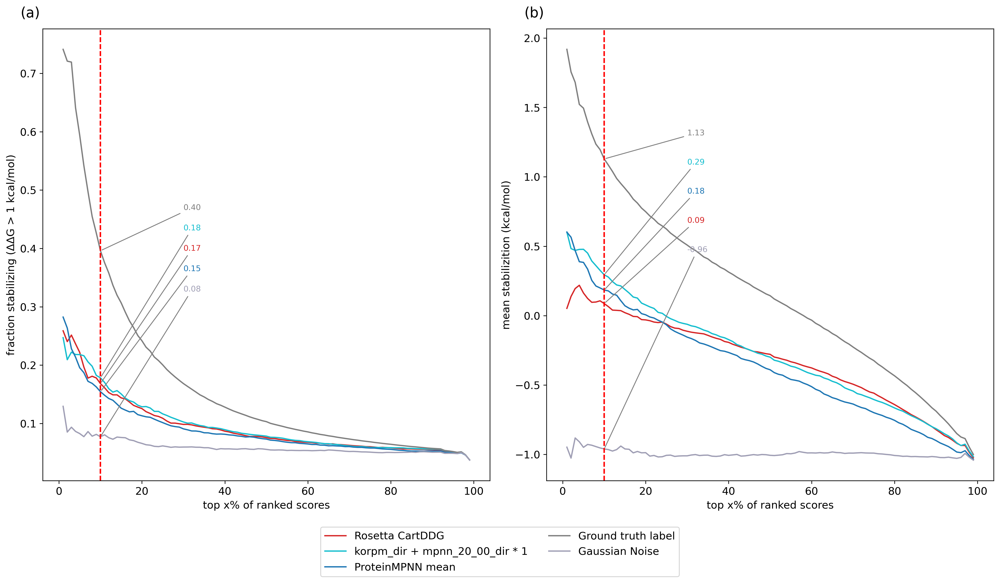

In [29]:
importlib.reload(analysis_utils)
# extra figure (not in text)
analysis_utils.recovery_curves(d1.reset_index(), ['mpnn_mean_dir', 'cartesian_ddg_dir', 'korpm_dir + mpnn_20_00_dir * 1', 'ddG_dir', 'dTm_dir', 'random_dir'], spacing=0.07, measurements=['ddG'])

4719


  0%|          | 0/3 [00:00<?, ?it/s]

1673.601666666667
Text(0.5, 0, 'rel_ASA_dir')
Text(1.5, 0, 'delta_kdh_dir')
Text(2.5, 0, 'delta_vol_dir')
Text(3.5, 0, 'korpm_dir')
Text(4.5, 0, 'esm1v_mean_dir')
Text(5.5, 0, 'mif_dir')
Text(6.5, 0, 'esmif_multimer_dir')
Text(7.5, 0, 'ankh_dir')
Text(8.5, 0, 'msa_transformer_mean_dir')
Text(9.5, 0, 'esm2_dir')
Text(10.5, 0, 'mifst_dir')
Text(11.5, 0, 'tranception_dir')
Text(12.5, 0, 'mpnn_20_00_dir')
Text(13.5, 0, 'cartesian_ddg_dir')
Text(0, 0.5, 'rel_ASA_dir')
Text(0, 1.5, 'delta_kdh_dir')
Text(0, 2.5, 'delta_vol_dir')
Text(0, 3.5, 'korpm_dir')
Text(0, 4.5, 'esm1v_mean_dir')
Text(0, 5.5, 'mif_dir')
Text(0, 6.5, 'esmif_multimer_dir')
Text(0, 7.5, 'ankh_dir')
Text(0, 8.5, 'msa_transformer_mean_dir')
Text(0, 9.5, 'esm2_dir')
Text(0, 10.5, 'mifst_dir')
Text(0, 11.5, 'tranception_dir')
Text(0, 12.5, 'mpnn_20_00_dir')
Text(0, 13.5, 'cartesian_ddg_dir')
['relative ASA', 'Δ hydrophobicity', 'Δ volume', 'KORPM', 'ESM-1V mean', 'MIF', 'ESM-IF', 'Ankh', 'MSA-T mean', 'ESM-2 3B', 'MIF-ST', 'Tra

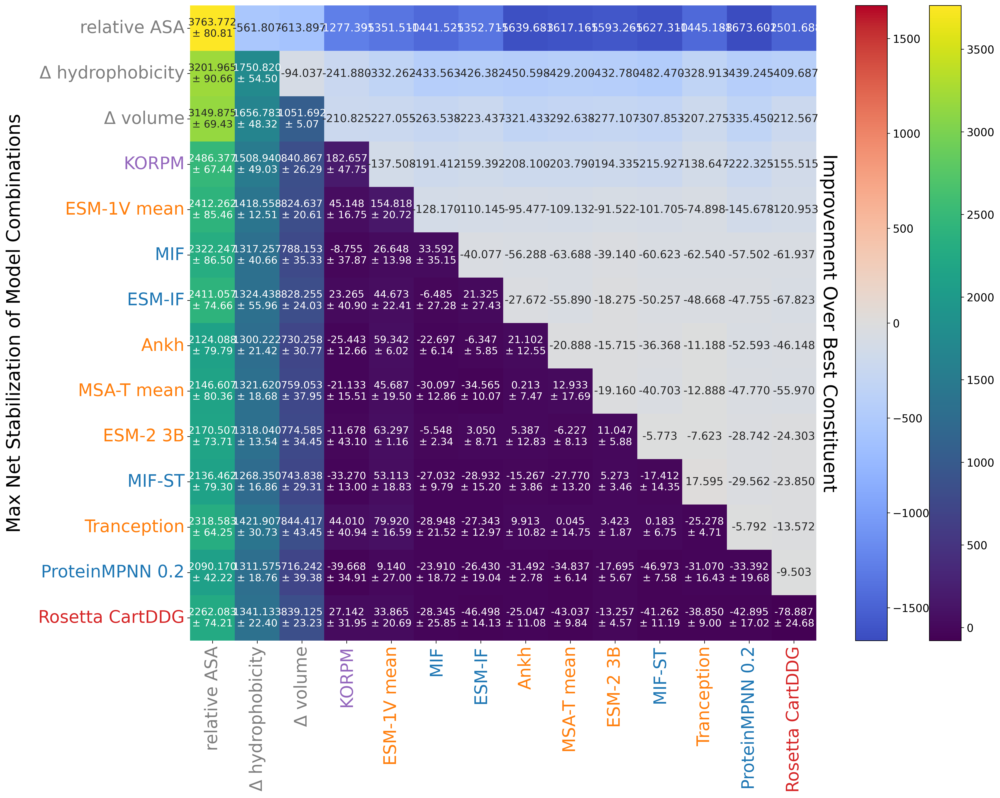

,rank,model1,weight1,model2,weight2,mean_net_stabilization,p_value
0,1,rel_ASA_dir,1,delta_kdh_dir,0.2,3201.965,0.001079
1,1,rel_ASA_dir,1,delta_vol_dir,0.2,3149.875,0.00468
2,1,rel_ASA_dir,1,delta_kdh_dir,0.5,2834.983333,0.000117
3,1,rel_ASA_dir,1,delta_vol_dir,0.5,2574.388333,0.001042
4,1,rel_ASA_dir,1,delta_kdh_dir,1,2504.11,0.000119
...,...,...,...,...,...,...,...
450,1,cartesian_ddg_dir,1,ankh_dir,0.2,-159.336667,0.009345
451,1,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,-161.89,0.002785
452,1,cartesian_ddg_dir,1,mifst_dir,0.2,-166.253333,0.00051
453,1,cartesian_ddg_dir,1,mif_dir,0.5,-168.238333,0.009977


In [30]:
# Figure 3
importlib.reload(analysis_utils)
custom_colors = {
                 'cartesian_ddg_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_dir': 'green',
                 'ankh_dir': 'blue',
                 'esm2_dir': 'blue',
                 #'esmif_monomer_dir': 'red',
                 'esmif_multimer_dir': 'purple',
                 #'esmif_multimer_full_masked_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'korpm_dir': 'red',
                 'delta_kdh_dir': 'blue',
                 'delta_vol_dir': 'blue',
                 #'delta_chg_dir': 'blue',
                 #'random_dir': 'black',
                 'rel_ASA_dir': 'red',
                }

measurement = 'ddG'
statistic = 'net_stabilization'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm, db_ddg, statistic, measurement, n_bootstraps=3, subset=list(custom_colors.keys()), grouper=None, upper='delta')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

#stat_df.to_csv('~/zs_suppl/model_combinations_ddG_net_stab_nonneg_test.csv')
stat_df

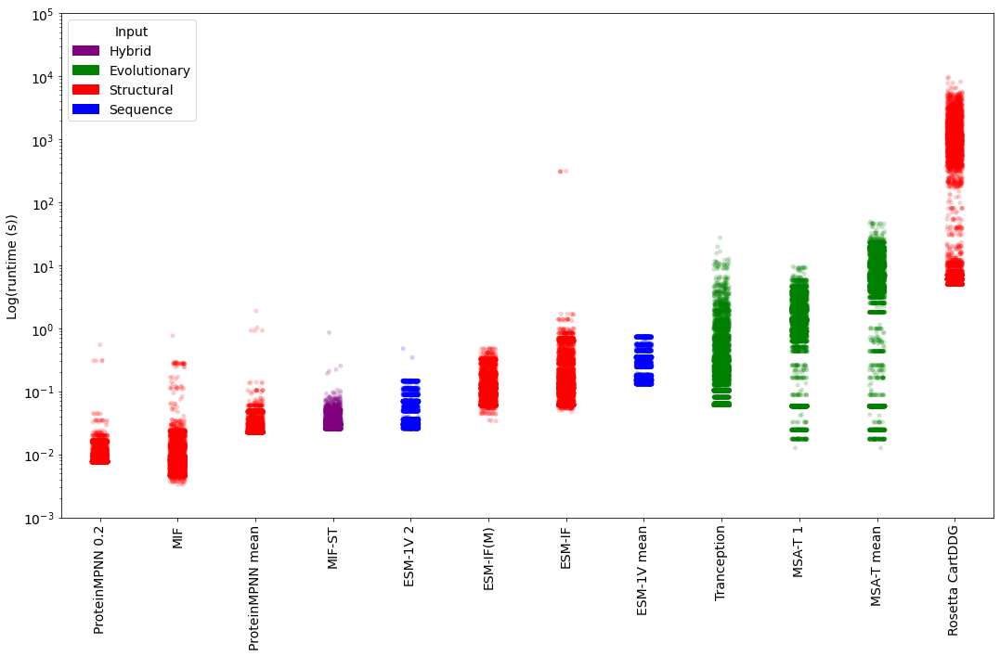

In [31]:
# SUPPLEMENTARY FIGURE 5

int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_monomer_dir',
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_mpnn_mean_dir',
                             'runtime_tranception_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_msa_1_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm1v_2_dir',
                             'runtime_cartesian_ddg_dir',
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])

hybrid = ['mifst']
evolutionary = ['tranception', 'msa_transformer_mean', 'msa_1']
sequence = ['esm1v_mean', 'esm1v_2']
structural = ['cartesian_ddg', 'esmif_multimer', 'esmif_multimer', 'esmif_monomer', 'mpnn_20_00', 'mpnn_mean', 'mif', 'korpm']

cmap = {}
for h in hybrid:
    cmap.update({h: 'purple'})
for e in evolutionary:
    cmap.update({e: 'green'})
for s in structural:
    cmap.update({s: 'red'})
for s in sequence:
    cmap.update({s: 'blue'})

hybrid_patch = Patch(color='purple', label='Hybrid')
evolutionary_patch = Patch(color='green', label='Evolutionary')
structural_patch = Patch(color='red', label='Structural')
sequence_patch = Patch(color='blue', label='Sequence')

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10))  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', palette=cmap, alpha=0.2)
ax.legend(handles=[hybrid_patch, evolutionary_patch, structural_patch, sequence_patch], title='Input', loc='upper left')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.yscale('log')
plt.ylim(10e-4, 10e4)
plt.xticks(rotation=90)
plt.xlabel('')
plt.ylabel('Log(runtime (s))')
plt.show()

In [32]:
# SUPPLEMENTARY FIGURE 6

measurement = 'ddG'
statistic = 'auprc'

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm, db_measurements, statistic, measurement, n_bootstraps=100, custom_colors=custom_colors)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

#stat_df.to_csv('../../zs_suppl/model_combinations_ddG_auprc_nonneg.csv')
stat_df.head(30)


TypeError: model_combinations_heatmap() got an unexpected keyword argument 'custom_colors'

  0%|          | 0/5 [00:00<?, ?it/s]

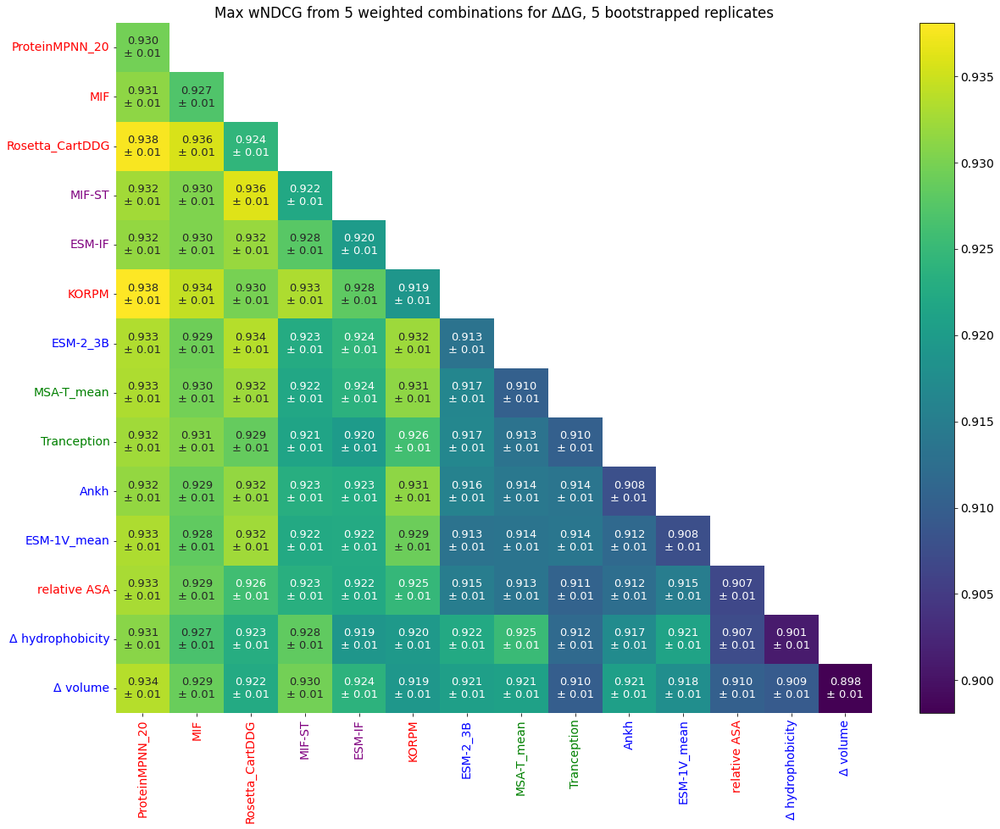

,rank,model1,weight1,model2,weight2,mean_weighted_ndcg,p_value
0,1,korpm_dir,1,mpnn_20_00_dir,1,0.938087,0.000266
1,1,mpnn_20_00_dir,1,korpm_dir,0.5,0.93794,0.000008
2,1,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,0.937677,0.00622
3,1,cartesian_ddg_dir,1,mpnn_20_00_dir,1,0.936964,0.004428
4,1,cartesian_ddg_dir,1,mifst_dir,0.5,0.936077,0.001225
5,1,cartesian_ddg_dir,1,mif_dir,1,0.935735,0.003709
6,1,korpm_dir,1,mpnn_20_00_dir,0.5,0.935583,0.004818
7,1,mpnn_20_00_dir,1,korpm_dir,0.2,0.934767,0.000014
8,1,mif_dir,1,korpm_dir,0.5,0.934413,0.001174
9,1,cartesian_ddg_dir,1,mif_dir,0.5,0.934341,0.010894


In [ ]:
# SUPPLEMENTARY FIGURE 8

measurement = 'ddG'
statistic = 'weighted_ndcg'

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm, db_measurements, statistic, measurement, n_bootstraps=5, custom_colors=custom_colors)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

#stat_df.to_csv('../../zs_suppl/model_combinations_ddG_ndcg_nonneg.csv')
stat_df.head(30)


  0%|          | 0/10 [00:00<?, ?it/s]

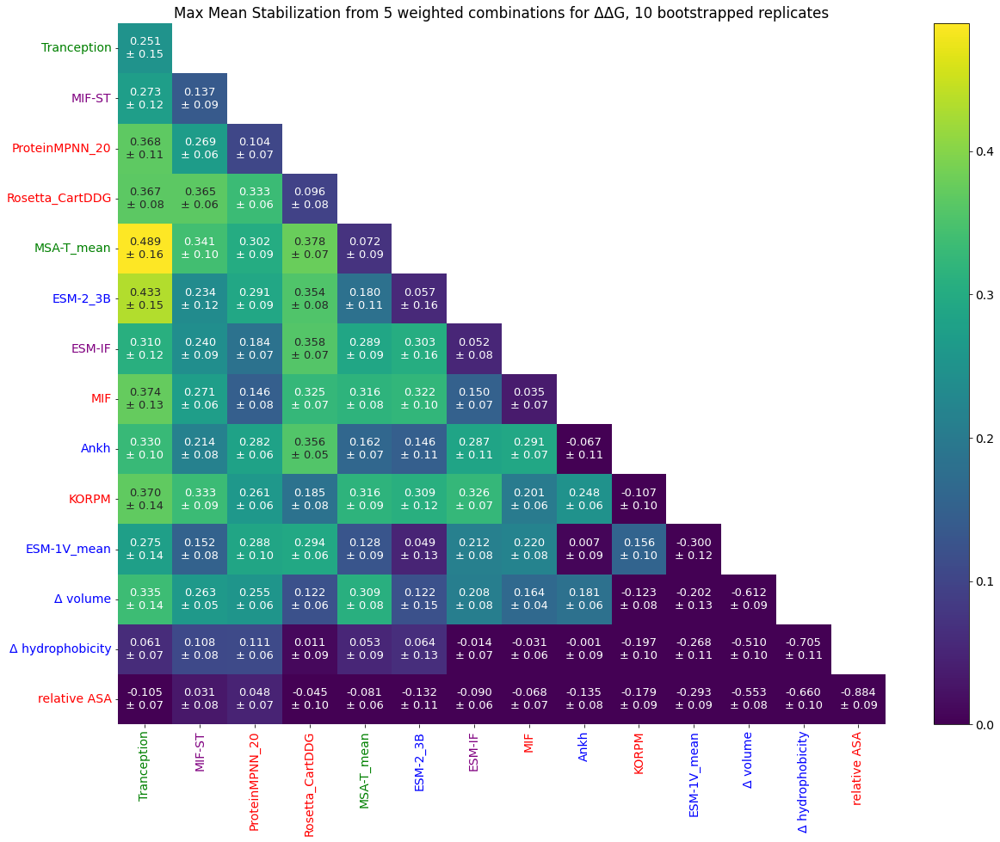

,rank,model1,weight1,model2,weight2,mean_mean_stabilization,p_value
0,1,tranception_dir,1,msa_transformer_mean_dir,0.2,0.489196,0.0
1,1,tranception_dir,1,esm2_dir,0.2,0.432524,0.000002
2,1,tranception_dir,1,msa_transformer_mean_dir,0.5,0.417333,0.000168
3,1,msa_transformer_mean_dir,1,cartesian_ddg_dir,1,0.377951,0.000005
4,1,tranception_dir,1,mif_dir,0.2,0.374345,0.000295
5,1,tranception_dir,1,korpm_dir,0.2,0.369847,0.000034
6,1,tranception_dir,1,mpnn_20_00_dir,0.2,0.368026,0.000787
7,1,tranception_dir,1,cartesian_ddg_dir,1,0.366598,0.001846
8,1,cartesian_ddg_dir,1,mifst_dir,0.5,0.365416,0.000051
9,1,tranception_dir,1,cartesian_ddg_dir,0.2,0.363741,0.000908


In [ ]:
# SUPPLEMENTARY FIGURE 9

measurement = 'ddG'
statistic = 'mean_stabilization'

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm, db_measurements, statistic, measurement, n_bootstraps=10, threshold=0, custom_colors=custom_colors)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

#stat_df.to_csv('../../zs_suppl/model_combinations_ddG_mean_stab_nonneg.csv')
stat_df.head(30)

In [ ]:
# preprocessing for feature comparisons between datasets

db_feats_2['neff'] = db_feats_2['neff'].fillna(0)
fp_feats = db_feats_2
fp_feats['neff'] = fp_feats['neff'].fillna(0)
fp_feats['rel_ASA']

db = pd.read_csv(os.path.join(path, 'data', 's669_mapped.csv'))

db['uid2'] = db['code'] + '_' + (db['position'].astype(int) - db['offset_up'].astype(int)).astype(str) + db['mutation'].str[-1]
db = db.set_index(['uid', 'uid2'])

cols = db.columns
drop = [col for col in db.columns if 'Unnamed' in col]
drop += [col for col in db.columns if 'pdb' in col]
drop += [col for col in db.columns if 'offset' in col]

db_full = db.copy(deep=True)
db_full['uid3'] = db['code'] + '_' + db['PDB_Mut'].str[1:]
db_full = db_full.reset_index().set_index('uid3')

s461 = pd.read_csv(os.path.join(path, 'data', 'S461.csv'))
s461['uid3'] = s461['PDB'] + '_' + s461['MUT_D'].str[2:]
s461 = s461.set_index('uid3')
s461['ddG_I'] = -s461['ddG_D']

s461.columns = [s+'_dir' for s in s461.columns]
s461 = s461.rename({'ddG_D_dir': 'ddG_dir', 'ddG_I_dir': 'ddG_inv'}, axis=1)


db = s461.join(db_full, how='left').reset_index(drop=True).set_index(['uid', 'uid2'])
#db.to_csv(os.path.join(path, '..', 'S461_joined.csv'))
db = db.drop(drop, axis=1)
db = db.drop(['PDB_dir', 'MUT_D_dir'], axis=1)

s669_combined = db.copy(deep=True).reset_index()
s669_combined = s669_combined.set_index('uid').drop(['multimer', 'nmr_xray', 'pH', 'resolution', 'wild_type'], axis=1)

neff = pd.read_csv(os.path.join(path, 'data', 'neff_s669.csv'), header=None).set_index(0)
neff.index.name = 'code'
neff.columns = ['neff']

s669_feats = pd.read_csv(os.path.join(path, 'data', 's669_mapped_feats.csv'))
s669_feats['uid'] = s669_feats['code'] + '_' + s669_feats['position'].astype(str) + s669_feats['mutation']
s669_feats = s669_feats[['uid', 'wild_type', 'on_interface', 'entropy', 'conservation', 'column_completeness', 'completeness_score', 'n_seqs', 'structure_length', 'multimer', 'SS',
                        'features', 'hbonds', 'saltbrs', 'b_factor', 'kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'rel_ASA', 'nmr_xray', 'pH', 'resolution']] # 'residue_depth',

s669_feats['on_interface'] = s669_feats['on_interface'].astype(int)
s669_feats['features'] = s669_feats['features'].fillna("")#.apply(list)
#s669_combined = s669_combined.join(ddgs)
s669_combined = s669_combined.join(s669_feats.set_index('uid')).drop('code', axis=1)
s669_combined['delta_kdh'] = s669_combined['kdh_mut'] - s669_combined['kdh_wt']
s669_combined['delta_vol'] = s669_combined['vol_mut'] - s669_combined['vol_wt']
s669_combined['delta_chg'] = s669_combined['chg_mut'] - s669_combined['chg_wt']
s669_combined['delta_asa'] = s669_combined['SOL_ACC_inv'] - s669_combined['SOL_ACC_dir']
s669_combined['to_proline'] = (s669_combined.index.str[-1] == 'P').astype(int)
s669_combined['to_glycine'] = (s669_combined.index.str[-1] == 'G').astype(int)
s669_combined['from_proline'] = s669_combined['wild_type'] == 'P'
s669_combined['from_glycine'] = s669_combined['wild_type'] == 'G'
s669_combined['helix'] = s669_combined['SS'] == 'H'
s669_combined['bend'] = s669_combined['SS'] == 'S'
s669_combined['turn'] = s669_combined['SS'] == 'T'
s669_combined['coil'] = s669_combined['SS'] == '-'
s669_combined['strand'] = s669_combined['SS'] == 'E'
s669_combined['xray_else_NMR'] = s669_combined['nmr_xray'].str.contains('X-RAY')
s669_combined['active_site'] = s669_combined['features'].str.contains('ACT_SITE')
s669_combined['resolution'] = s669_combined['resolution'].fillna('').apply(lambda x: analysis_utils.extract_decimal_number(x))

s669_combined = s669_combined.drop(['kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'features', 'SS', 'wild_type', 'nmr_xray'], axis=1)

s669_combined['code'] = s669_combined.index.str[:4]
s669_combined = s669_combined.reset_index().merge(neff['neff'].dropna(), on='code', how='left')#.drop('code', axis=1)#.set_index('uid')
s669_combined['neff'] = s669_combined['neff'].fillna(0)
unique_indices = s669_combined.groupby('uid')['neff'].idxmax()#.astype(int)
s669_combined = s669_combined.loc[unique_indices].set_index('uid')

s669_combined['random_dir'] = np.random.rand(len(s669_combined)) - 0.5
s669_combined['random_inv'] = np.random.rand(len(s669_combined)) - 0.5
s669_combined = s669_combined.rename({'ddG_dir': 'ddG'}, axis=1)

s461_feats = s669_combined
s461_feats['rel_ASA']

uid
1A0F_11A     0.000000
1BA3_457D    0.190217
1BA3_485D    1.000000
1BA3_485K    1.000000
1BA3_485M    1.000000
               ...   
4HE7_19G     0.764151
4HE7_19K     0.764151
5JXB_25G     0.975460
5JXB_25P     0.975460
5OAQ_199H    0.004505
Name: rel_ASA, Length: 461, dtype: float64

In [ ]:
from sklearn.preprocessing import MinMaxScaler

def compare_distributions_violin(df1, df2):
    remap_names = {'delta_chg': 'Δ charge', 'delta_vol': 'Δ volume', 'hbonds': 'wt hydrogen bonds', 
                    'multimer': 'chains in assembly', 'neff': 'n effective sequences', 'b_factor': 'beta factor',
                    'rel_ASA': 'SASA', 'delta_kdh': 'Δ hydrophobicity', 'ddG': 'ΔΔG', 'structure_length': 'n residues', 
                    'completeness_score': 'alignment completeness'}

    # Identify shared columns
    shared_columns = set(df1.columns).intersection(df2.columns)
    print(shared_columns)

    # Exclude boolean columns
    shared_columns = [col for col in shared_columns if df1[col].dtype != 'bool' and df2[col].dtype != 'bool']

    # Create a combined dataframe with an extra column to indicate the source dataframe
    df1_copy = df1[shared_columns].copy()
    df1_copy['source'] = 'FireProtDB'

    df2_copy = df2[shared_columns].copy()
    df2_copy['source'] = 'S461'

    combined_df = pd.concat([df1_copy, df2_copy])

    # Apply Min-Max Scaling
    scaler = MinMaxScaler()
    combined_df[shared_columns] = scaler.fit_transform(combined_df[shared_columns])

    # Melt the dataframe to long format for plotting
    melted_df = combined_df.melt(id_vars='source', value_vars=shared_columns)

    # Plot a violin plot for each shared column
    plt.figure(figsize=(20, 10))
    ax = sns.violinplot(x='variable', y='value', hue='source', split=True, data=melted_df, bw=0.05)

    for i, col in enumerate(shared_columns):
        # Calculate medians before transformation
        median_df1 = df1[col].median()
        median_df2 = df2[col].median()

        # Normalize column
        combined_col = pd.concat([df1[[col]], df2[[col]]])
        combined_col_scaled = scaler.fit_transform(combined_col)

        # Create DataFrame for violin plot
        violin_df = pd.DataFrame({
            'Column': [i]*len(combined_col),  # replace column name with numeric value
            'Value': combined_col_scaled.flatten(),
            'Source': ['df1']*len(df1) + ['df2']*len(df2)
        })

        # Plot violin
        #sns.violinplot(x='Column', y='Value', hue='Source', data=violin_df, split=True, inner=None, ax=ax)

        # Plot median markers
        median_df1_scaled = scaler.transform([[median_df1]])[0, 0]
        median_df2_scaled = scaler.transform([[median_df2]])[0, 0]
        plt.plot([i-0.2, i], [median_df1_scaled, median_df1_scaled], color='blue', linestyle='dashed')
        plt.plot([i, i+0.2], [median_df2_scaled, median_df2_scaled], color='red', linestyle='dashed')

        # Annotate median markers
        ax.text(i-0.6, median_df1_scaled, f'{median_df1:.2f}', color='blue', va='center', fontsize=10)
        ax.text(i+0.3, median_df2_scaled, f'{median_df2:.2f}', color='red', va='center', fontsize=10)

    remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
    ax.set_xticklabels(remapped_x)

    plt.title('Feature Distribution for each Dataset')
    plt.xticks(rotation=90)
    plt.xlabel('Feature')
    plt.ylabel('Normalized Value')
    plt.show()


{'completeness_score', 'rel_ASA', 'is_nmr', 'bend', 'from_glycine', 'multimer', 'to_proline', 'neff', 'delta_vol', 'to_glycine', 'from_proline', 'strand', 'hbonds', 'helix', 'b_factor', 'pH', 'coil', 'conservation', 'entropy', 'structure_length', 'delta_kdh', 'delta_chg', 'active_site', 'turn'}


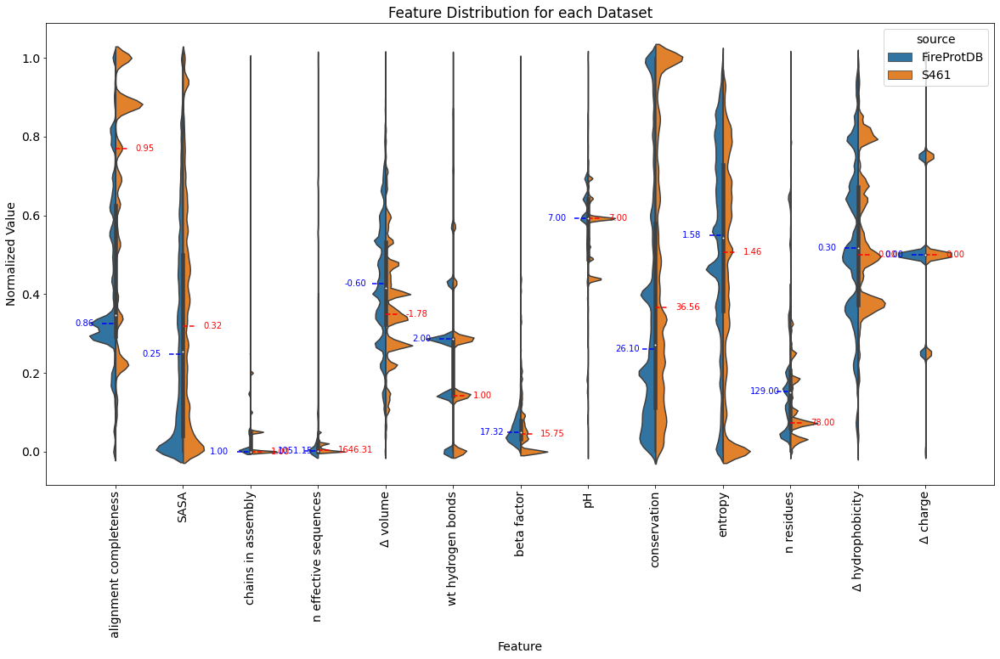

In [ ]:
# SUPPLEMENTARY FIGURE 10

compare_distributions_violin(fp_feats.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1), s461_feats)

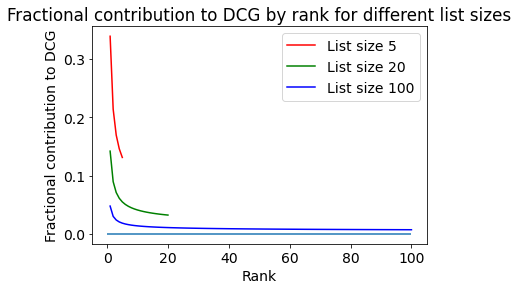

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def fractional_contributions(list_size, base=2):
    ranks = np.arange(1, list_size+1)
    discounts = 1 / np.log2(ranks + 1)  # compute the discount for each rank
    return discounts / np.sum(discounts)  # normalize to get fractional contributions

list_sizes = [5, 20, 100]
colors = ['r', 'g', 'b']

for i, list_size in enumerate(list_sizes):
    fractions = fractional_contributions(list_size)
    plt.plot(np.arange(1, list_size+1), fractions, color=colors[i], label=f'List size {list_size}')

plt.xlabel('Rank')
plt.ylabel('Fractional contribution to DCG')
plt.title('Fractional contribution to DCG by rank for different list sizes')
plt.hlines(0, 0, 100)
plt.legend()
plt.show()

In [ ]:
# The following cells are extra analyses not included in the paper

In [ ]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 #'msa_transformer_median_dir': 'green',
                 'tranception_dir': 'green',
                 #'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey',
                 'mpnn_mean_dir + cartesian_ddg_dir * 1': 'red',
                 'mpnn_mean_dir + korpm_dir * 1': 'red'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
db_complete = dfm.drop('code', axis=1)[list(custom_colors.keys())+['ddG', 'dTm']]
analysis_utils.compute_stats(db_complete, stats=('n', 'mean_stabilization', 'pred_positives'), measurements=['ddG', 'dTm']).drop('runtime', axis=1)

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

n  \
measurement model_type   model                                 class           
dTm         NaN          ddG_dir                                      1554.0   
            evolutionary esm1v_mean_dir                               2788.0   
                         msa_transformer_mean_dir                     2788.0   
                         tranception_dir                              2788.0   
            structural   cartesian_ddg_dir                            2788.0   
                         esmif_multimer_dir                           2788.0   
                         korpm_dir                                    2788.0   
                         mif_dir                                      2788.0   
                         mifst_dir                                    2788.0   
                         mpnn_mean_dir                                2788.0   
                         mpnn_mean_dir + cartesian_ddg_dir * 1        2788.0   
                         mpnn_mean_dir + korpm_dir * 1                2788.0   
ddG         NaN          ddG_dir                                      5043.0   
            evolutionary esm1v_mean_dir                               5043.0   
                         msa_transformer_mean_dir                     5043.0   
                         tranception_dir                              5043.0   
            structural   cartesian_ddg_dir                            5043.0   
                         esmif_multimer_dir                           5043.0   
                         korpm_dir                                    5043.0   
                         mif_dir                                      5043.0   
                         mifst_dir                                    5043.0   
                         mpnn_mean_dir                                5043.0   
                         mpnn_mean_dir + cartesian_ddg_dir * 1        5043.0   
                         mpnn_mean_dir + korpm_dir * 1                5043.0   

                                                                      pred_positives  \
measurement model_type   model                                 class                   
dTm         NaN          ddG_dir                                               428.0   
            evolutionary esm1v_mean_dir                                        545.0   
                         msa_transformer_mean_dir                              346.0   
                         tranception_dir                                       352.0   
            structural   cartesian_ddg_dir                                     888.0   
                         esmif_multimer_dir                                    392.0   
                         korpm_dir                                             925.0   
                         mif_dir                                               562.0   
                         mifst_dir                                             431.0   
                         mpnn_mean_dir                                         548.0   
                         mpnn_mean_dir + cartesian_ddg_dir * 1                 571.0   
                         mpnn_mean_dir + korpm_dir * 1                         562.0   
ddG         NaN          ddG_dir                                              1371.0   
            evolutionary esm1v_mean_dir                                        558.0   
                         msa_transformer_mean_dir                              213.0   
                         tranception_dir                                       171.0   
            structural   cartesian_ddg_dir                                    1034.0   
                         esmif_multimer_dir                                    512.0   
                         korpm_dir                                            1314.0   
                         mif_dir                                               701.0   
                         mifst_dir                        

Average prediction for stabilized protein: -0.49609476646840933
Average experimental value for predicted stabilized: 0.3340901360544218


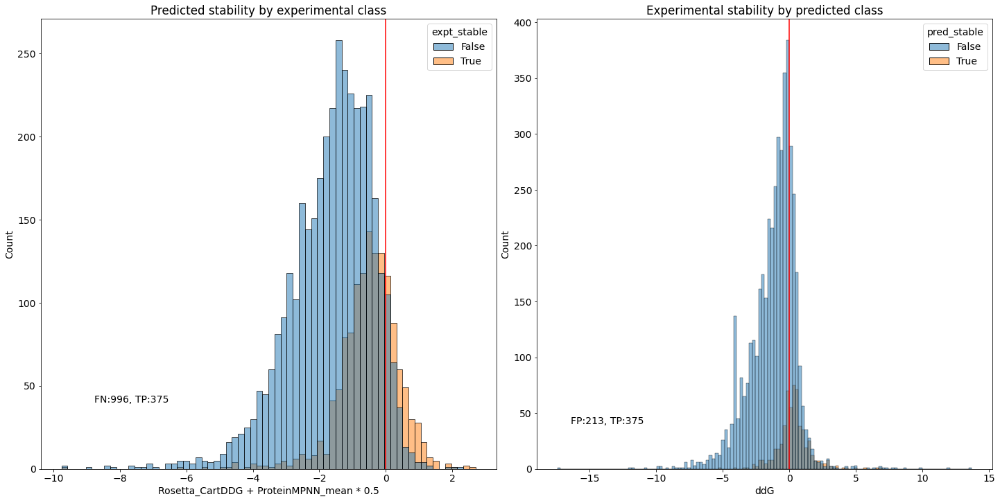

n_expt_stable                          1371.000000
P(pred_stable|stable) - sensitivity       0.273523
P(pred_stable|unstable) - FPR             0.058007
n_pred_stable                           588.000000
P(stable|pred_stable) - PPV               0.670068
P(stable|pred_unstable) - FOR             0.237486
dtype: float64

In [ ]:
def compare_stable_dists(db_complete, score_name, decision_threshold_ddg=0, decision_threshold_score=0, x_label_1=None):

    dbf = db_complete.copy(deep=True)
    dbf = dbf.loc[:, [score_name, 'ddG']]
    min_score = dbf[score_name].min() + 1
    min_ddg = dbf['ddG'].min() + 1

    # todo: add dTm
    df_out = pd.Series(index = ['n_expt_stable', 'P(pred_stable|stable) - sensitivity', 'P(pred_stable|unstable) - FPR',\
                                 'n_pred_stable', 'P(stable|pred_stable) - PPV', 'P(stable|pred_unstable) - FOR'], dtype=float)
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    #fig.suptitle(score_name)
    axs[0].set_title(f'Predicted stability by experimental class')
    axs[1].set_title(f'Experimental stability by predicted class')

    stable = dbf.loc[dbf['ddG'] > decision_threshold_ddg, :].dropna().copy()
    stable['expt_stable'] = True
    unstable = dbf.loc[dbf['ddG'] <= decision_threshold_ddg, :].dropna().copy()
    unstable['expt_stable'] = False
    to_plot = pd.concat([stable, unstable])

    df_out['n_expt_stable'] = len(stable)
    df_out['P(pred_stable|stable) - sensitivity'] = len(stable.loc[stable[score_name] >= decision_threshold_score]) / len(stable)
    df_out['P(pred_stable|unstable) - FPR'] = len(unstable.loc[unstable[score_name] >= decision_threshold_score]) / len(unstable)

    left = len(stable.loc[stable[score_name] <= decision_threshold_score])
    right = len(stable.loc[stable[score_name] > decision_threshold_score])
    sns.histplot(ax=axs[0], data=to_plot, x=score_name, hue='expt_stable')
    axs[0].annotate(f'FN:{left}, TP:{right}', xy=(min_score,40))
    axs[0].axvline(x = decision_threshold_score, color = 'r', label = 'axvline - full height')
    axs[0].set_xlabel(x_label_1)

    avg = stable[score_name].mean()
    print('Average prediction for stabilized protein:', avg)

    predicted_stable = dbf.loc[dbf[score_name] > decision_threshold_score, :].dropna().copy()
    predicted_stable['pred_stable'] = True
    predicted_unstable = dbf.loc[dbf[score_name] <= decision_threshold_score, :].dropna().copy()
    predicted_unstable['pred_stable'] = False
    to_plot = pd.concat([predicted_stable, predicted_unstable])

    df_out['n_pred_stable'] = len(predicted_stable)
    df_out['P(stable|pred_stable) - PPV'] = len(predicted_stable.loc[predicted_stable['ddG'] >= decision_threshold_ddg]) / len(predicted_stable)
    df_out['P(stable|pred_unstable) - FOR'] = len(predicted_unstable.loc[predicted_unstable['ddG'] >= decision_threshold_ddg]) / len(predicted_unstable)
    
    left = len(predicted_stable.loc[predicted_stable['ddG'] <= decision_threshold_ddg])
    right = len(predicted_stable.loc[predicted_stable['ddG'] > decision_threshold_ddg])
    sns.histplot(ax=axs[1], data=to_plot, x='ddG', hue='pred_stable')
    axs[1].annotate(f'FP:{left}, TP:{right}', xy=(min_ddg,40))
    axs[1].axvline(x = decision_threshold_ddg, color = 'r', label = 'axvline - full height')

    avg = predicted_stable['ddG'].mean()
    print('Average experimental value for predicted stabilized:', avg)
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    plt.show()

    return df_out

s = dfm.drop(['ProTherm', 'FireProt', 'ThermoFluor'], axis=1).drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir') #.join(db_feats_2, how='left')
compare_stable_dists(s, 'cartesian_ddg_dir + mpnn_mean_dir * 0.5', decision_threshold_ddg=0, decision_threshold_score=0, x_label_1='Rosetta_CartDDG + ProteinMPNN_mean * 0.5')